<center>
<h2>Data Science Lab on Smart Cities</h2>
<i>Mobility in Northern Sardinia</i>
</center>

In [325]:
# imports

import numpy as np
import pandas as pd
import geopandas as gpd
from matplotlib import pyplot as plt
import seaborn as sns

<center>
<h4><b>Data Analysis</b></h4>
</center>

In [326]:
# read municipalities data

municipalities_sassari = gpd.read_file('../data/processed/municipalities_sassari.geojson')

print(type(municipalities_sassari))
print('')
print(municipalities_sassari.shape)
print('')
print(municipalities_sassari.columns)

<class 'geopandas.geodataframe.GeoDataFrame'>

(92, 13)

Index(['COD_RIP', 'COD_REG', 'COD_PROV', 'COD_CM', 'COD_UTS', 'PRO_COM',
       'PRO_COM_T', 'COMUNE', 'COMUNE_A', 'CC_UTS', 'SHAPE_LENG', 'Shape_Le_1',
       'geometry'],
      dtype='object')


In [327]:
# read airports data

aiports_AD_sardinia = pd.read_csv('../data/processed/ad_airports.csv')

print(aiports_AD_sardinia.shape)
print('')
print(aiports_AD_sardinia.columns)
print('')
print(aiports_AD_sardinia.head(2))

(3195, 7)

Index(['Data', 'Porto/Aeroporto', 'Nome', 'Arrivi di Linea',
       'Arrivi non di Linea', 'Partenze di Linea', 'Partenze non di Linea'],
      dtype='object')

         Data Porto/Aeroporto     Nome  Arrivi di Linea  Arrivi non di Linea  \
0  2023-08-27       Aeroporto    Olbia           9610.0                939.0   
1  2023-08-27       Aeroporto  Alghero           2449.0                215.0   

   Partenze di Linea  Partenze non di Linea  
0            12841.0                 1019.0  
1             3433.0                  203.0  


In [328]:
# read ports data

ports_AD_sardinia = pd.read_csv('../data/processed/ad_ports.csv')

print(ports_AD_sardinia.shape)
print('')
print(ports_AD_sardinia.columns)
print('')
print(ports_AD_sardinia.head(2))

(1692, 7)

Index(['Data', 'Porto/Aeroporto', 'Nome', 'Arrivi di Linea',
       'Arrivi non di Linea', 'Partenze di Linea', 'Partenze non di Linea'],
      dtype='object')

         Data Porto/Aeroporto   Nome  Arrivi di Linea  Arrivi non di Linea  \
0  2023-08-28           Porto  Olbia              0.0              13388.0   
1  2023-08-27           Porto  Olbia              0.0              10623.0   

   Partenze di Linea  Partenze non di Linea  
0                0.0                23239.0  
1                0.0                20170.0  


In [329]:
# read passenger flows data

passenger_flows_airports_sardinia = pd.read_csv('../data/processed/passenger_flows_airports_sardinia.csv')

print(passenger_flows_airports_sardinia.shape)
print('')
print(passenger_flows_airports_sardinia.columns)
print('')
print(passenger_flows_airports_sardinia.head(2))

(1062, 6)

Index(['Aeroporto', 'Anno', 'Periodo', 'Zona', 'Pass_Arrivo', 'Pass_Partenza'], dtype='object')

  Aeroporto  Anno Periodo     Zona  Pass_Arrivo  Pass_Partenza
0   Alghero  2023      S1       02        54822          51636
1   Alghero  2023      S1  13 + 14        15010          13877


In [330]:
# read passenger zones data

passengers_zones = pd.read_csv('../data/processed/passengers_zones.csv')

print(passengers_zones.shape)
print('')
print(passengers_zones.columns)
print('')
print(passengers_zones.head(2))

(37, 4)

Index(['Paese', 'ISO2', 'regione', 'ID_zona'], dtype='object')

    Paese ISO2                regione  ID_zona
0  Italia   IT               Sardegna        1
1  Italia   IT  Friuli-Venezia Giulia        2


In [331]:
# read public transports data

stops_sassari = pd.read_csv('../data/processed/stops_sassari.csv')

print(stops_sassari.shape)
print('')
print(stops_sassari.columns)
print('')
print(stops_sassari.head(2))

(2710, 6)

Index(['stop_id', 'stop_name', 'stop_lat', 'stop_lon', 'stop_comune',
       'stop_type'],
      dtype='object')

     stop_id                        stop_name   stop_lat  stop_lon  \
0  ATPSS_455       Fermata di Via De Cupis 32  40.761698  8.500294   
1   ASPO1051  Fermata di 1051 - Colcò agraria  40.905960  9.501480   

  stop_comune        stop_type  
0     SASSARI  Fermata Autobus  
1       OLBIA  Fermata Autobus  


In [332]:
# read population data

population_sassari = pd.read_csv('../data/processed/population_sassari.csv')

print(population_sassari.shape)
print('')
print(population_sassari.columns)
print('')
print(population_sassari.head(2))

(92, 2)

Index(['Comune', 'Popolazione'], dtype='object')

     Comune  Popolazione
0    Aggius         1403
1  Aglientu         1169


In [333]:
# create and read airports location data

# list of airport locations (latitude, longitude)
airports = [
    {"name": "Olbia", "lat": 41.07967129384658, "lon": 9.415011243574186},
    {"name": "Alghero", "lat": 40.63337940194076, "lon": 8.289823824729778}
]

In [334]:
airports_df = pd.DataFrame(airports, columns=['name', 'lat', 'lon'])
print(airports_df)
airports_df.to_csv('../data/processed/airports_df.csv', index=False)

      name        lat       lon
0    Olbia  41.079671  9.415011
1  Alghero  40.633379  8.289824


In [335]:
# read beaches data

beach_systems = pd.read_csv('../data/processed/beach_systems.csv')

print(beach_systems.shape)
print('')
print(beach_systems.columns)
print('')
print(beach_systems.head(2))

(303, 4)

Index(['idFeature', 'tipoElCod', 'tipoElDesc', 'geometry'], dtype='object')

   idFeature  tipoElCod           tipoElDesc  \
0         13          6  Sistemi di spiaggia   
1         15          6  Sistemi di spiaggia   

                                            geometry  
0  POLYGON ((9.43612585161113 41.13590407660926, ...  
1  POLYGON ((9.285661087721051 39.21405187199449,...  


---

<center>
<h4><b><i>Indicators</i></b></h4>
</center>

**Passenger Arrival and Departure Counts - Airports**

In [336]:
# convert 'Data' column to datetime format
aiports_AD_sardinia['Data'] = pd.to_datetime(aiports_AD_sardinia['Data'])

In [337]:
# filter the DataFrame based on the date range (from 2019-01-01 to 2022-12-31)
start_date = pd.to_datetime("2019-01-01")
end_date = pd.to_datetime("2022-12-31")
filtered_aiports_AD_sardinia = aiports_AD_sardinia[(aiports_AD_sardinia['Data'] >= start_date) & (aiports_AD_sardinia['Data'] <= end_date)]

In [338]:
# group by 'Nome' (Airport Name) and calculate the sum of passenger counts
passenger_counts_air = filtered_aiports_AD_sardinia.groupby('Nome')[['Arrivi di Linea', 'Arrivi non di Linea', 'Partenze di Linea', 'Partenze non di Linea']].sum().reset_index()

# rename columns for clarity
passenger_counts_air.rename(columns={'Nome': 'Airport'}, inplace=True)

passenger_counts_air

,Airport,Arrivi di Linea,Arrivi non di Linea,Partenze di Linea,Partenze non di Linea
0,Alghero,2091683.0,76513.0,2109908.0,67135.0
1,Olbia,4320178.0,198347.0,4366473.0,205616.0


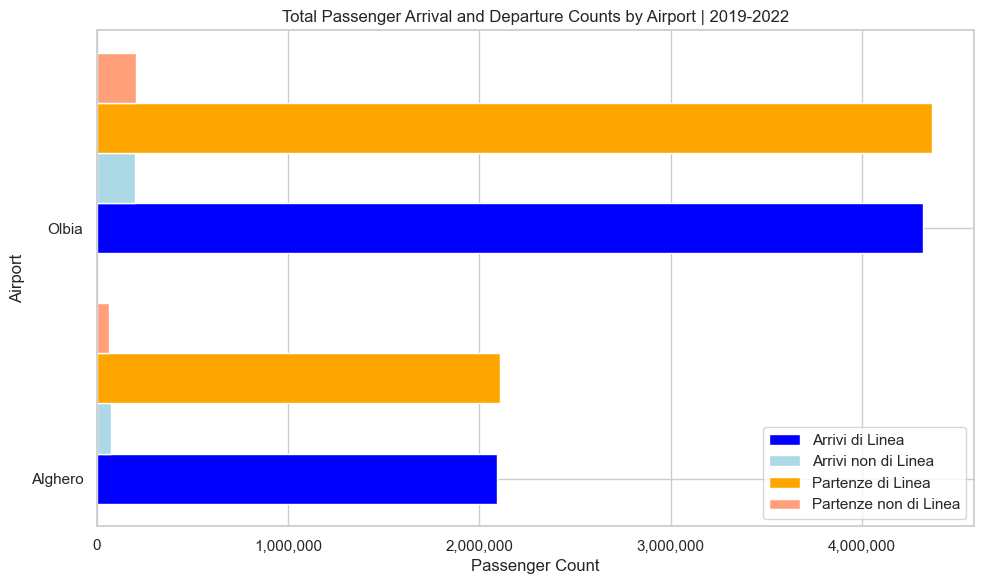

In [339]:
from matplotlib.ticker import FuncFormatter

# create horizontal bar plots for passenger arrivals and departures
plt.figure(figsize=(10, 6))

bar_width = 0.2
index = range(len(passenger_counts_air))

plt.barh(index, passenger_counts_air['Arrivi di Linea'], bar_width, label='Arrivi di Linea', color='blue')
plt.barh([i + bar_width for i in index], passenger_counts_air['Arrivi non di Linea'], bar_width, label='Arrivi non di Linea', color='lightblue')
plt.barh([i + 2*bar_width for i in index], passenger_counts_air['Partenze di Linea'], bar_width, label='Partenze di Linea', color='orange')
plt.barh([i + 3*bar_width for i in index], passenger_counts_air['Partenze non di Linea'], bar_width, label='Partenze non di Linea', color='lightsalmon')

plt.xlabel('Passenger Count')
plt.ylabel('Airport')
plt.title('Total Passenger Arrival and Departure Counts by Airport | 2019-2022')
plt.legend()
plt.yticks(index, passenger_counts_air['Airport'])
plt.gca().xaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{int(x):,}'))  # format x-axis ticks as comma-separated numbers
plt.tight_layout()

# save the image
plt.savefig('../figures/Passenger Arrival and Departure Counts by Airport.png')
plt.show()

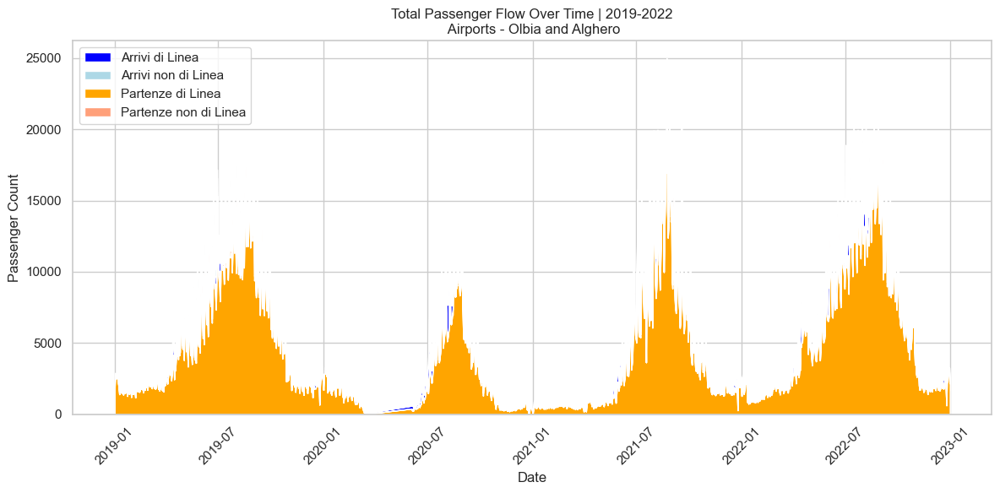

In [340]:
# calculate the total passenger arrival and departure counts for each date
passenger_counts_air2 = filtered_aiports_AD_sardinia.groupby('Data')[['Arrivi di Linea', 'Arrivi non di Linea', 'Partenze di Linea', 'Partenze non di Linea']].sum().reset_index()

# create a stacked area plot for passenger flow over time
plt.figure(figsize=(12, 6))

plt.stackplot(passenger_counts_air2['Data'], passenger_counts_air2['Arrivi di Linea'], passenger_counts_air2['Arrivi non di Linea'],
              labels=['Arrivi di Linea', 'Arrivi non di Linea'], colors=['blue', 'lightblue'])
plt.stackplot(passenger_counts_air2['Data'], passenger_counts_air2['Partenze di Linea'], passenger_counts_air2['Partenze non di Linea'],
              labels=['Partenze di Linea', 'Partenze non di Linea'], colors=['orange', 'lightsalmon'])

plt.xlabel('Date')
plt.ylabel('Passenger Count')
plt.title('Total Passenger Flow Over Time | 2019-2022\n Airports - Olbia and Alghero')
plt.legend(loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()

# save the image
plt.savefig('../figures/Passenger Flow Over Time - Airports.png')
plt.show()

We can also observe the effects of the Covid pandemics

In [341]:
# extract the year from the 'Data' column
filtered_aiports_AD_sardinia['Year'] = filtered_aiports_AD_sardinia['Data'].dt.year

# group by 'Nome' (Airport Name) and 'Year', and calculate the sum of passenger counts
passenger_counts_by_year_air = filtered_aiports_AD_sardinia.groupby(['Nome', 'Year'])[['Arrivi di Linea', 'Arrivi non di Linea', 'Partenze di Linea', 'Partenze non di Linea']].sum().reset_index()

# rename columns for clarity
passenger_counts_by_year_air.rename(columns={'Nome': 'Airport'}, inplace=True)

passenger_counts_by_year_air

C:\Users\FC\AppData\Local\Temp\ipykernel_19224\1831932177.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Airport,Year,Arrivi di Linea,Arrivi non di Linea,Partenze di Linea,Partenze non di Linea
0,Alghero,2019,637526.0,52255.0,643028.0,47205.0
1,Alghero,2020,261163.0,5393.0,263415.0,3828.0
2,Alghero,2021,444783.0,6205.0,449001.0,5359.0
3,Alghero,2022,748211.0,12660.0,754464.0,10743.0
4,Olbia,2019,1369079.0,79688.0,1374255.0,80501.0
5,Olbia,2020,484705.0,8490.0,494465.0,11231.0
6,Olbia,2021,978134.0,41496.0,997178.0,42800.0
7,Olbia,2022,1488260.0,68673.0,1500575.0,71084.0


Analyzing the Pass_Arrivo and Pass_Partenza for each airport separately can provide insights into which airports are experiencing higher passenger traffic.

**Passenger Arrival and Departure Counts - Ports**

In [342]:
# convert 'Data' column to datetime format
ports_AD_sardinia['Data'] = pd.to_datetime(ports_AD_sardinia['Data'])

In [343]:
# filter the DataFrame based on the date range (from 2019-01-01 to 2022-12-31)
start_date = pd.to_datetime("2019-01-01")
end_date = pd.to_datetime("2022-12-31")
filtered_ports_AD_sardinia = ports_AD_sardinia[(ports_AD_sardinia['Data'] >= start_date) & (ports_AD_sardinia['Data'] <= end_date)]

In [344]:
# calculate the sum of passenger counts
passenger_counts_sea = filtered_ports_AD_sardinia.groupby('Nome')[['Arrivi di Linea', 'Arrivi non di Linea', 'Partenze di Linea', 'Partenze non di Linea']].sum().reset_index()

# rename columns for clarity
passenger_counts_sea.rename(columns={'Nome': 'Port'}, inplace=True)

passenger_counts_sea

,Port,Arrivi di Linea,Arrivi non di Linea,Partenze di Linea,Partenze non di Linea
0,Olbia,4880637.0,281043.0,4834969.0,299198.0


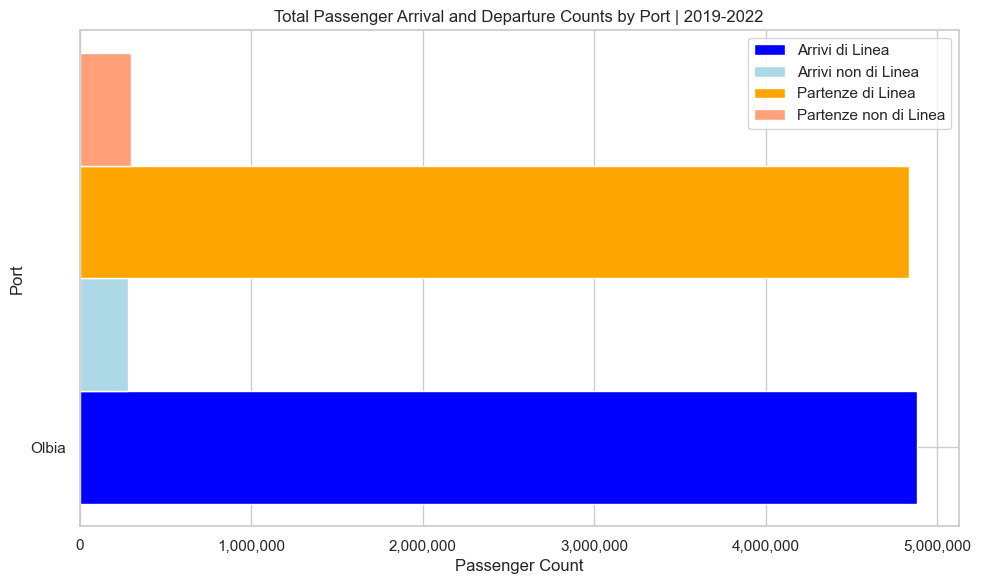

In [345]:
from matplotlib.ticker import FuncFormatter

# create horizontal bar plots for passenger arrivals and departures
plt.figure(figsize=(10, 6))

bar_width = 0.2
index = range(len(passenger_counts_sea))

plt.barh(index, passenger_counts_sea['Arrivi di Linea'], bar_width, label='Arrivi di Linea', color='blue')
plt.barh([i + bar_width for i in index], passenger_counts_sea['Arrivi non di Linea'], bar_width, label='Arrivi non di Linea', color='lightblue')
plt.barh([i + 2*bar_width for i in index], passenger_counts_sea['Partenze di Linea'], bar_width, label='Partenze di Linea', color='orange')
plt.barh([i + 3*bar_width for i in index], passenger_counts_sea['Partenze non di Linea'], bar_width, label='Partenze non di Linea', color='lightsalmon')

plt.xlabel('Passenger Count')
plt.ylabel('Port')
plt.title('Total Passenger Arrival and Departure Counts by Port | 2019-2022')
plt.legend()
plt.yticks(index, passenger_counts_sea['Port'])
plt.gca().xaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{int(x):,}'))  # format x-axis ticks as comma-separated numbers
plt.tight_layout()

# save the image
plt.savefig('../figures/Passenger Arrival and Departure Counts by Port.png')
plt.show()

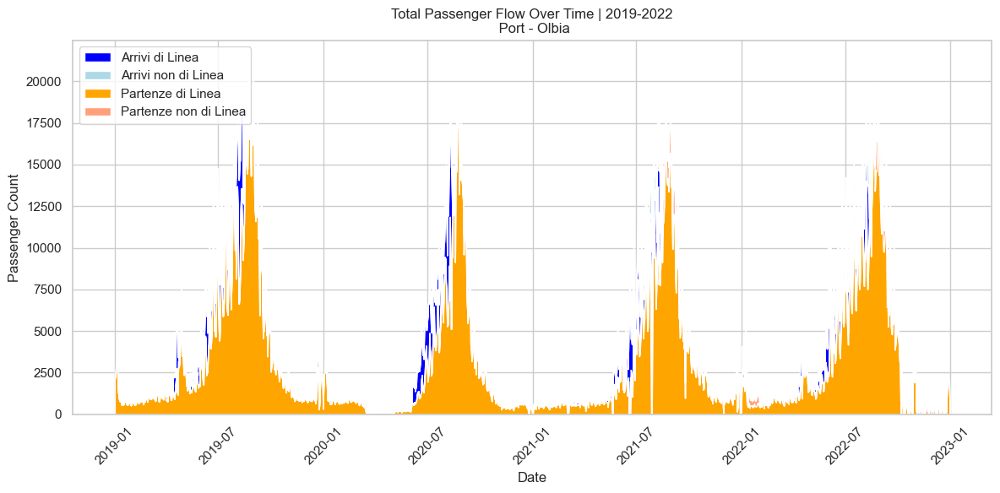

In [346]:
# calculate the total passenger arrival and departure counts for each date
passenger_counts_sea2 = filtered_ports_AD_sardinia.groupby('Data')[['Arrivi di Linea', 'Arrivi non di Linea', 'Partenze di Linea', 'Partenze non di Linea']].sum().reset_index()

# create a stacked area plot for passenger flow over time
plt.figure(figsize=(12, 6))

plt.stackplot(passenger_counts_sea2['Data'], passenger_counts_sea2['Arrivi di Linea'], passenger_counts_sea2['Arrivi non di Linea'],
              labels=['Arrivi di Linea', 'Arrivi non di Linea'], colors=['blue', 'lightblue'])
plt.stackplot(passenger_counts_sea2['Data'], passenger_counts_sea2['Partenze di Linea'], passenger_counts_sea2['Partenze non di Linea'],
              labels=['Partenze di Linea', 'Partenze non di Linea'], colors=['orange', 'lightsalmon'])

plt.xlabel('Date')
plt.ylabel('Passenger Count')
plt.title('Total Passenger Flow Over Time | 2019-2022\n Port - Olbia')
plt.legend(loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()

# save the image
plt.savefig('../figures/Passenger Flow Over Time - Ports.png')
plt.show()

In [347]:
# extract the year from the 'Data' column
filtered_ports_AD_sardinia['Year'] = filtered_ports_AD_sardinia['Data'].dt.year

# group by 'Nome' (Airport Name) and 'Year', and calculate the sum of passenger counts
passenger_counts_by_year_sea = filtered_ports_AD_sardinia.groupby(['Nome', 'Year'])[['Arrivi di Linea', 'Arrivi non di Linea', 'Partenze di Linea', 'Partenze non di Linea']].sum().reset_index()

# rename columns for clarity
passenger_counts_by_year_sea.rename(columns={'Nome': 'Port'}, inplace=True)

passenger_counts_by_year_sea

C:\Users\FC\AppData\Local\Temp\ipykernel_19224\579959426.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Port,Year,Arrivi di Linea,Arrivi non di Linea,Partenze di Linea,Partenze non di Linea
0,Olbia,2019,1520155.0,0.0,1510910.0,36.0
1,Olbia,2020,933460.0,6698.0,916225.0,14673.0
2,Olbia,2021,1139380.0,117459.0,1107479.0,120066.0
3,Olbia,2022,1287642.0,156886.0,1300355.0,164423.0


Analyzing the Pass_Arrivo and Pass_Partenza for each airport separately can provide insights into which airports are experiencing higher passenger traffic.

**Seasonal Variation**

From now on, considering only airports data

In [348]:
aiports_AD_sardinia.head()

,Data,Porto/Aeroporto,Nome,Arrivi di Linea,Arrivi non di Linea,Partenze di Linea,Partenze non di Linea
0,2023-08-27,Aeroporto,Olbia,9610.0,939.0,12841.0,1019.0
1,2023-08-27,Aeroporto,Alghero,2449.0,215.0,3433.0,203.0
2,2023-08-26,Aeroporto,Olbia,12140.0,1169.0,13978.0,1244.0
3,2023-08-26,Aeroporto,Alghero,2736.0,0.0,3527.0,3.0
4,2023-08-25,Aeroporto,Olbia,9707.0,531.0,12542.0,690.0


In [349]:
# convert 'Data' column to datetime format
aiports_AD_sardinia['Data'] = pd.to_datetime(aiports_AD_sardinia['Data'])

In [350]:
'''
Spring: 03-21 | 06-20
Summer: 06-21 | 09-22
Fall:   09-23 | 12-20
Winter: 12-21 | 03-20
'''

'\nSpring: 03-21 | 06-20\nSummer: 06-21 | 09-22\nFall:   09-23 | 12-20\nWinter: 12-21 | 03-20\n'

In [351]:
# define the date ranges for each season
seasons = [
    ("Winter", pd.to_datetime("2019-01-01"), pd.to_datetime("2019-03-20")),
    ("Spring", pd.to_datetime("2019-03-21"), pd.to_datetime("2019-06-20")),
    ("Summer", pd.to_datetime("2019-06-21"), pd.to_datetime("2019-09-22")),
    ("Fall", pd.to_datetime("2019-09-23"), pd.to_datetime("2019-12-20")),
    ("Winter", pd.to_datetime("2019-12-21"), pd.to_datetime("2020-03-19")),
    ("Spring", pd.to_datetime("2020-03-20"), pd.to_datetime("2020-06-20")),
    ("Summer", pd.to_datetime("2020-06-21"), pd.to_datetime("2020-09-22")),
    ("Fall", pd.to_datetime("2020-09-23"), pd.to_datetime("2020-12-20")),
    ("Winter", pd.to_datetime("2020-12-21"), pd.to_datetime("2021-03-20")),
    ("Spring", pd.to_datetime("2021-03-21"), pd.to_datetime("2021-06-20")),
    ("Summer", pd.to_datetime("2021-06-21"), pd.to_datetime("2021-09-22")),
    ("Fall", pd.to_datetime("2021-09-23"), pd.to_datetime("2021-12-20")),
    ("Winter", pd.to_datetime("2021-12-21"), pd.to_datetime("2022-03-20")),
    ("Spring", pd.to_datetime("2022-03-21"), pd.to_datetime("2022-06-20")),
    ("Summer", pd.to_datetime("2022-06-21"), pd.to_datetime("2022-09-22")),
    ("Fall", pd.to_datetime("2022-09-23"), pd.to_datetime("2022-12-20")),
    ("Winter", pd.to_datetime("2022-12-21"), pd.to_datetime("2022-12-31"))
]

Calculate the seasonal variation metrics for each season

In [352]:
# calculate the seasonal variation metrics for each season and divide by year
seasonal_variation = []

for season, start_date, end_date in seasons:
    for year in range(start_date.year, end_date.year + 1):
        season_data = aiports_AD_sardinia[(aiports_AD_sardinia['Data'] >= start_date) & (aiports_AD_sardinia['Data'] <= end_date) & (aiports_AD_sardinia['Data'].dt.year == year)]
        total_arrivals = season_data['Arrivi di Linea'].sum() + season_data['Arrivi non di Linea'].sum()
        total_departures = season_data['Partenze di Linea'].sum() + season_data['Partenze non di Linea'].sum()
        seasonal_variation.append((season, year, total_arrivals, total_departures))

seasonal_variation = pd.DataFrame(seasonal_variation, columns=["Season", "Year", "Total Arrivals", "Total Departures"])

In [353]:
seasonal_variation

,Season,Year,Total Arrivals,Total Departures
0,Winter,2019,141660.0,147235.0
1,Spring,2019,544054.0,479692.0
2,Summer,2019,1130269.0,1146333.0
3,Fall,2019,294556.0,345460.0
4,Winter,2019,28009.0,26269.0
5,Winter,2020,102306.0,105425.0
6,Spring,2020,14318.0,8813.0
7,Summer,2020,545165.0,539981.0
8,Fall,2020,93704.0,114825.0
9,Winter,2020,4258.0,3895.0


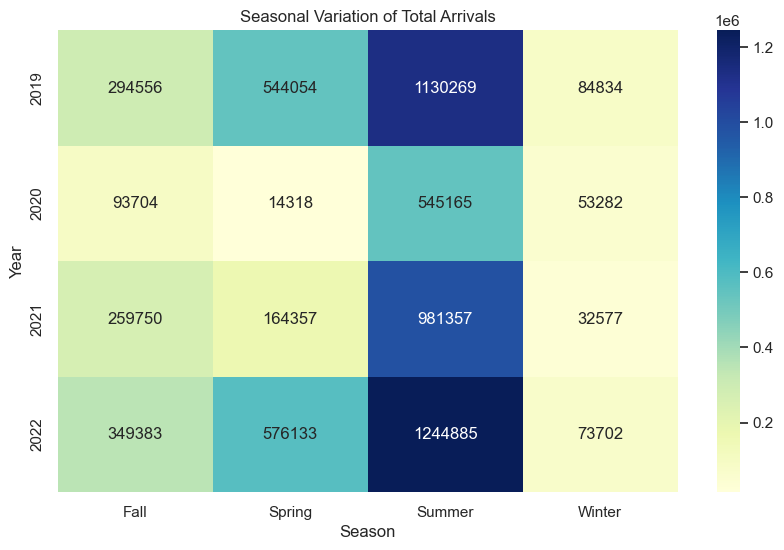

In [354]:
# create a pivot table for visualization
pivot_seasonal_variation = seasonal_variation.pivot_table(index='Year', columns='Season', values='Total Arrivals')

# create a heatmap using Seaborn
plt.figure(figsize=(10, 6))
sns.heatmap(pivot_seasonal_variation, cmap='YlGnBu', annot=True, fmt=".0f")
plt.title('Seasonal Variation of Total Arrivals')
plt.xlabel('Season')
plt.ylabel('Year')

# save the image
plt.savefig('../figures/Seasonal Variation of Total Arrivals.png')
plt.show()

In [355]:
# group the data by "Season" and calculate the average passenger flow for each season
seasonal_variation = seasonal_variation.groupby('Season')[['Total Arrivals', 'Total Departures']].mean().reset_index()

print(seasonal_variation)

   Season  Total Arrivals  Total Departures
0    Fall       249348.25        291089.500
1  Spring       324715.50        285936.500
2  Summer       975419.00        985070.250
3  Winter        61098.75         62593.375


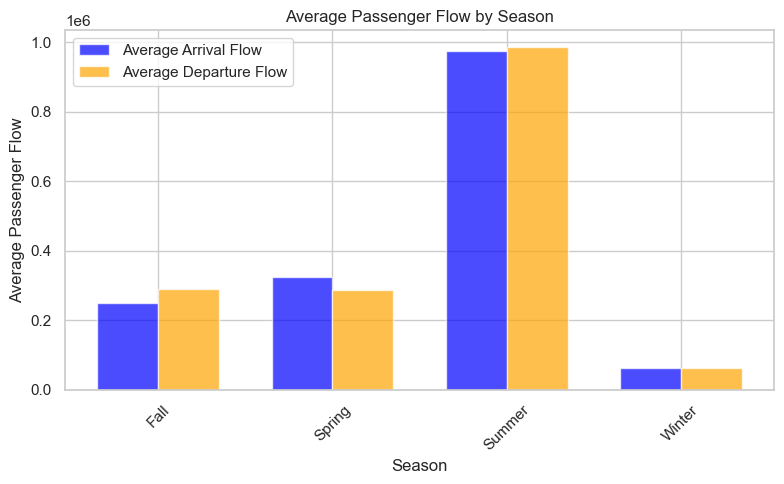

In [356]:
bar_width = 0.35  # adjust the width of the bars

plt.figure(figsize=(8, 5))

# calculate x-coordinates for the bars
x_arrival = range(len(seasonal_variation['Season']))
x_departure = [x + bar_width for x in x_arrival]

plt.bar(x_arrival, seasonal_variation['Total Arrivals'], width=bar_width, label='Average Arrival Flow', color='blue', alpha=0.7)
plt.bar(x_departure, seasonal_variation['Total Departures'], width=bar_width, label='Average Departure Flow', color='orange', alpha=0.7)

plt.title('Average Passenger Flow by Season')
plt.xlabel('Season')
plt.ylabel('Average Passenger Flow')
plt.legend()
plt.xticks([x + bar_width/2 for x in x_arrival], seasonal_variation['Season'], rotation=45)
plt.tight_layout()

# save the image
plt.savefig('../figures/Average Passenger Flow by Season - BarPlot.png')
plt.show()

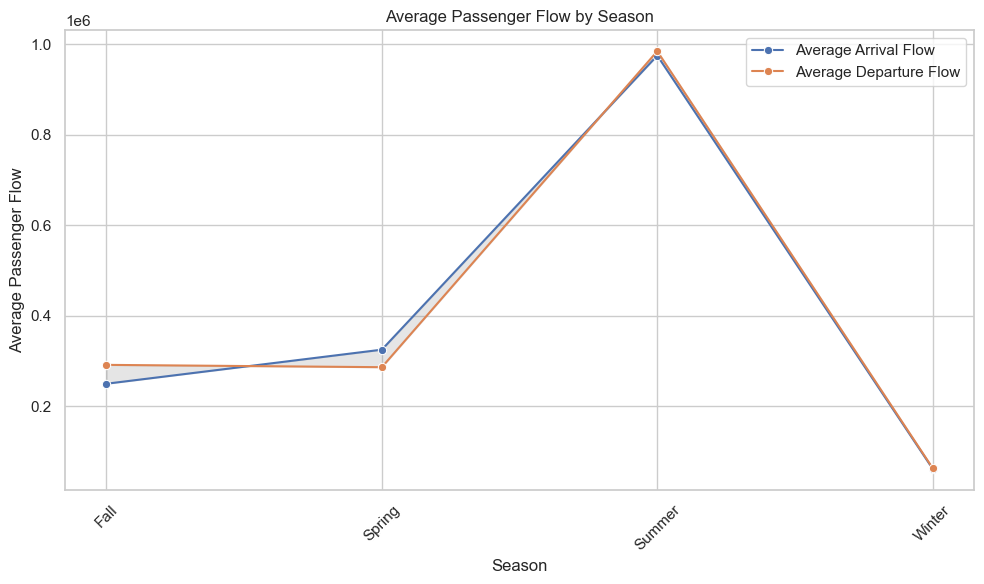

In [357]:
# create a line plot with shaded areas for average passenger flow by season
plt.figure(figsize=(10, 6))

sns.lineplot(data=seasonal_variation, x='Season', y='Total Arrivals', marker='o', label='Average Arrival Flow')
sns.lineplot(data=seasonal_variation, x='Season', y='Total Departures', marker='o', label='Average Departure Flow')

plt.fill_between(seasonal_variation['Season'], seasonal_variation['Total Arrivals'], seasonal_variation['Total Departures'], alpha=0.2, color='gray')

plt.title('Average Passenger Flow by Season')
plt.xlabel('Season')
plt.ylabel('Average Passenger Flow')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()

# save the image
plt.savefig('../figures/Average Passenger Flow by Season  - LinePlot.png')
plt.show()

In [358]:
# calculate the seasonal variation metrics for each season, divide by year and airport
seasonal_variation_airport = []

for season, start_date, end_date in seasons:
    for year in range(start_date.year, end_date.year + 1):
        for airport in aiports_AD_sardinia['Nome'].unique():
            season_data = aiports_AD_sardinia[(aiports_AD_sardinia['Data'] >= start_date) & (aiports_AD_sardinia['Data'] <= end_date) & (aiports_AD_sardinia['Data'].dt.year == year) & (aiports_AD_sardinia['Nome'] == airport)]
            total_arrivals = season_data['Arrivi di Linea'].sum() + season_data['Arrivi non di Linea'].sum()
            total_departures = season_data['Partenze di Linea'].sum() + season_data['Partenze non di Linea'].sum()
            seasonal_variation_airport.append((season, year, airport, total_arrivals, total_departures))

seasonal_variation_airport_df = pd.DataFrame(seasonal_variation_airport, columns=["Season", "Year", "Airport", "Total Arrivals", "Total Departures"])
print(seasonal_variation_airport_df)

    Season  Year  Airport  Total Arrivals  Total Departures
0   Winter  2019    Olbia         70652.0           72868.0
1   Winter  2019  Alghero         71008.0           74367.0
2   Spring  2019    Olbia        363616.0          314695.0
3   Spring  2019  Alghero        180438.0          164997.0
4   Summer  2019    Olbia        832755.0          846899.0
5   Summer  2019  Alghero        297514.0          299434.0
6     Fall  2019    Olbia        169240.0          208701.0
7     Fall  2019  Alghero        125316.0          136759.0
8   Winter  2019    Olbia         12504.0           11593.0
9   Winter  2019  Alghero         15505.0           14676.0
10  Winter  2020    Olbia         25769.0           27879.0
11  Winter  2020  Alghero         76537.0           77546.0
12  Spring  2020    Olbia          9342.0            5275.0
13  Spring  2020  Alghero          4976.0            3538.0
14  Summer  2020    Olbia        400842.0          398613.0
15  Summer  2020  Alghero        144323.

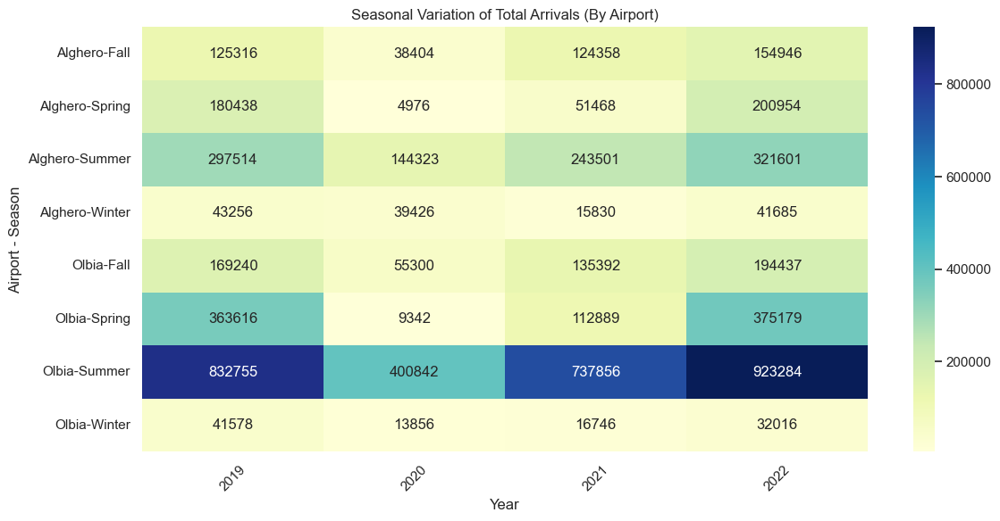

In [359]:
# create a pivot table for visualization
pivot_airport_seasonal_variation = seasonal_variation_airport_df.pivot_table(index=['Airport', 'Season'], columns='Year', values=['Total Arrivals', 'Total Departures'])

# create a heatmap using Seaborn
plt.figure(figsize=(12, 6))

sns.set_palette("pastel")
sns.heatmap(pivot_airport_seasonal_variation['Total Arrivals'], cmap='YlGnBu', annot=True, fmt=".0f")

plt.title('Seasonal Variation of Total Arrivals (By Airport)')
plt.xlabel('Year')
plt.ylabel('Airport - Season')
plt.xticks(rotation=45)
plt.tight_layout()

# save the image
plt.savefig('../figures/Seasonal Variation of Total Arrivals (By Airport).png')
plt.show()

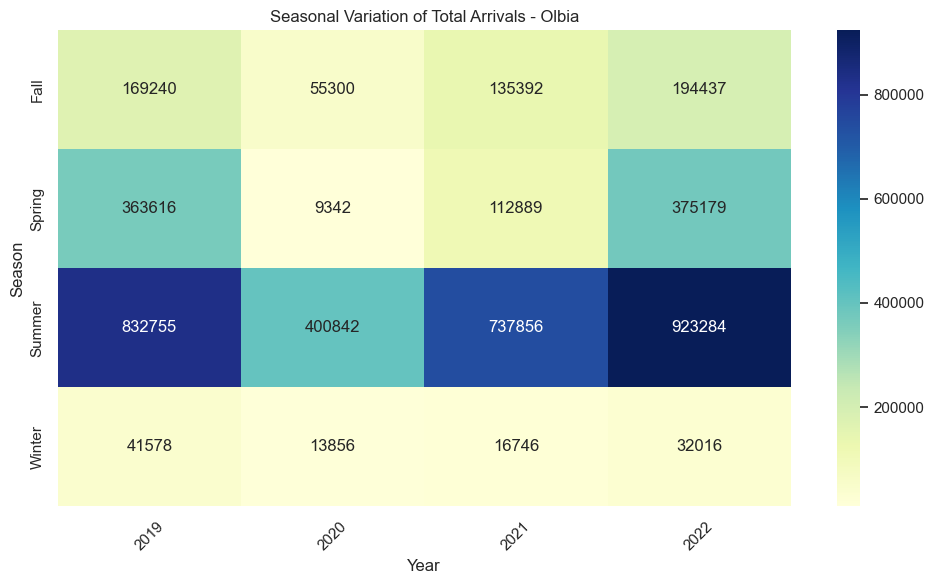

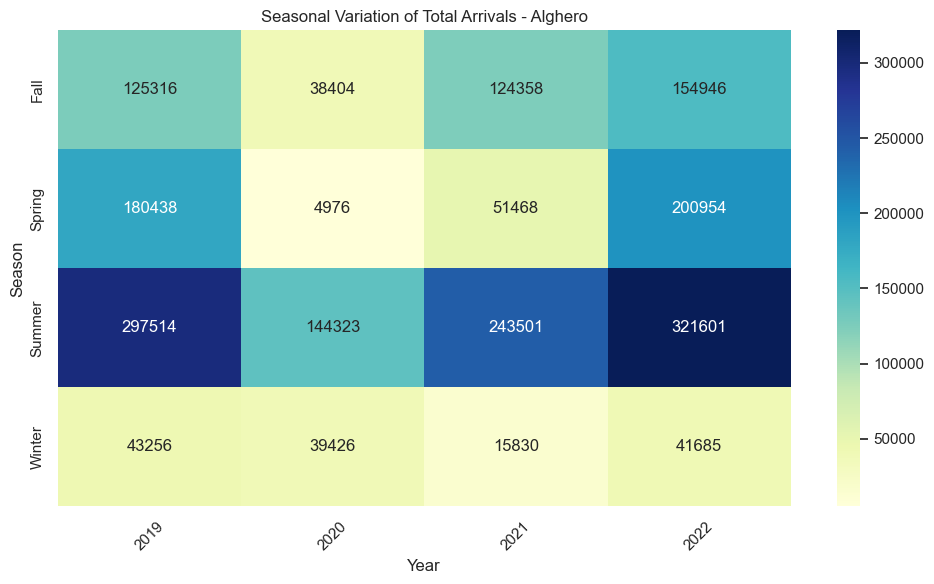

In [360]:
import os

# specify the directory path
output_directory = '../figures/'

# iterate through each airport and create a heatmap
for airport in seasonal_variation_airport_df['Airport'].unique():
    airport_data = seasonal_variation_airport_df[seasonal_variation_airport_df['Airport'] == airport]
    pivot_airport_data = airport_data.pivot_table(index='Season', columns='Year', values=['Total Arrivals', 'Total Departures'])
    
    plt.figure(figsize=(10, 6))
    sns.heatmap(pivot_airport_data['Total Arrivals'], cmap='YlGnBu', annot=True, fmt=".0f")
    plt.title(f'Seasonal Variation of Total Arrivals - {airport}')
    plt.xlabel('Year')
    plt.ylabel('Season')
    plt.xticks(rotation=45)
    plt.tight_layout()
    
    # save the image
    plt.savefig(os.path.join(output_directory, f'{airport} Seasonal Variation of Total Arrivals.png'))
    plt.show()

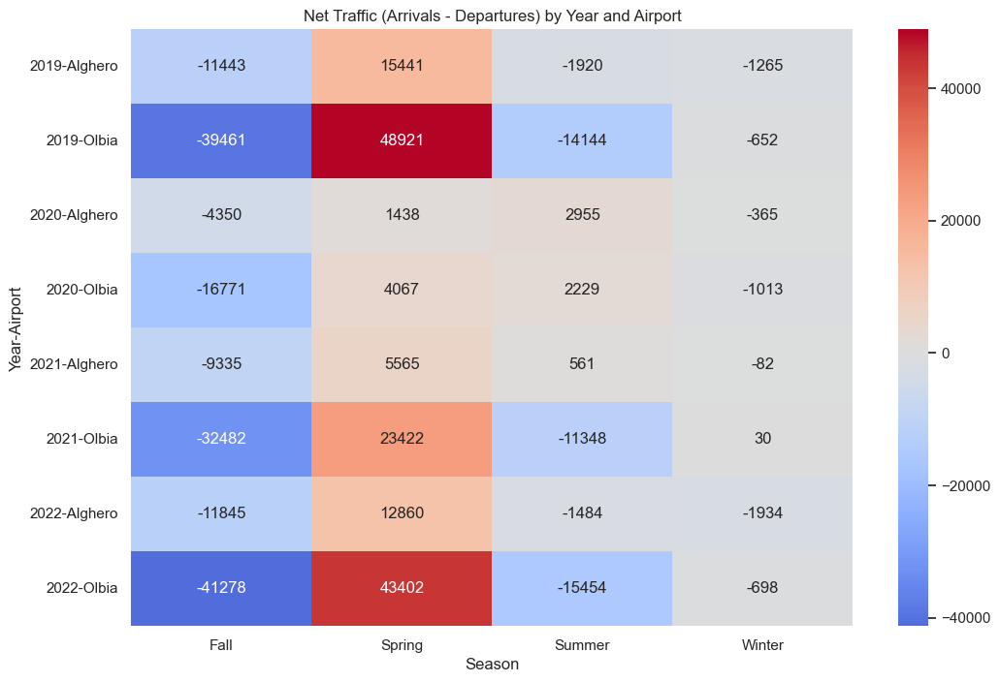

In [361]:
# calculate net traffic (Arrivals - Departures)
seasonal_variation_airport_df['Net Traffic'] = seasonal_variation_airport_df['Total Arrivals'] - seasonal_variation_airport_df['Total Departures']

# create a pivot table for better visualization
pivot_table = seasonal_variation_airport_df.pivot_table(index=['Year', 'Airport'], columns='Season', values='Net Traffic')

# plotting using Seaborn
plt.figure(figsize=(12, 8))
sns.set_theme()
sns.heatmap(pivot_table, annot=True, fmt=".0f", cmap='coolwarm', center=0)
plt.title('Net Traffic (Arrivals - Departures) by Year and Airport')

# save the image
plt.savefig('../figures/Net Traffic (Arrivals - Departures) by Year and Airport.png')
plt.show()

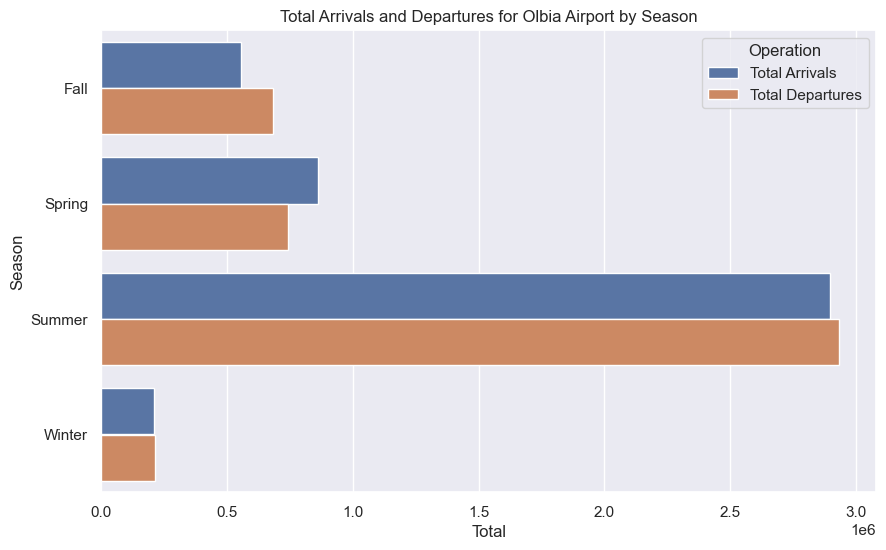

In [362]:
# filter data for Olbia airport
olbia_df = seasonal_variation_airport_df[seasonal_variation_airport_df['Airport'] == 'Olbia']

# group by season and calculate total arrivals and departures
seasonal_data = olbia_df.groupby('Season').agg({'Total Arrivals': 'sum', 'Total Departures': 'sum'}).reset_index()

# melt the data for plotting
melted_data = pd.melt(seasonal_data, id_vars=['Season'], value_vars=['Total Arrivals', 'Total Departures'])

# create a bar plot using Seaborn
plt.figure(figsize=(10, 6))
sns.set_theme()
sns.barplot(x='value', y='Season', hue='variable', data=melted_data, orient='h')
plt.xlabel('Total')
plt.ylabel('Season')
plt.title('Total Arrivals and Departures for Olbia Airport by Season')
plt.legend(title='Operation')

# save the image
plt.savefig('../figures/Total Arrivals and Departures for Olbia Airport by Season.png')
plt.show()

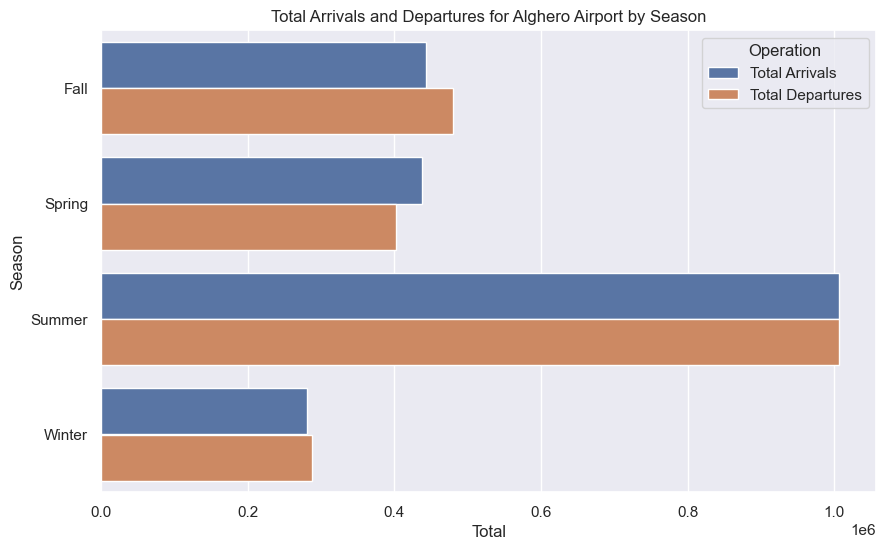

In [363]:
# filter data for Alghero airport
alghero_df = seasonal_variation_airport_df[seasonal_variation_airport_df['Airport'] == 'Alghero']

# group by season and calculate total arrivals and departures
seasonal_data = alghero_df.groupby('Season').agg({'Total Arrivals': 'sum', 'Total Departures': 'sum'}).reset_index()

# melt the data for plotting
melted_data = pd.melt(seasonal_data, id_vars=['Season'], value_vars=['Total Arrivals', 'Total Departures'])

# create a bar plot using Seaborn
plt.figure(figsize=(10, 6))
sns.set_theme()
sns.barplot(x='value', y='Season', hue='variable', data=melted_data, orient='h')
plt.xlabel('Total')
plt.ylabel('Season')
plt.title('Total Arrivals and Departures for Alghero Airport by Season')
plt.legend(title='Operation')

# save the image
plt.savefig('../figures/Total Arrivals and Departures for Alghero Airport by Season.png')
plt.show()

**Percentage of Domestic vs. International Passengers**

Combine Data: merge the two datasets (Flussi passeggeri aeroporti Sardegna and Paese,ISO2,regione,ID_zona) using the "Zona" or "ID_zona" column as the common key

In [364]:
passenger_flows_airports_sardinia.head()

,Aeroporto,Anno,Periodo,Zona,Pass_Arrivo,Pass_Partenza
0,Alghero,2023,S1,02,54822,51636
1,Alghero,2023,S1,13 + 14,15010,13877
2,Alghero,2023,S1,03 + 04,44246,43130
3,Alghero,2023,S1,12,11455,9874
4,Alghero,2023,S1,11,7994,7596


In [365]:
passengers_zones

,Paese,ISO2,regione,ID_zona
0,Italia,IT,Sardegna,1
1,Italia,IT,Friuli-Venezia Giulia,2
2,Italia,IT,Liguria,2
3,Italia,IT,Lombardia,2
4,Italia,IT,Piemonte,2
5,Italia,IT,Trentino-Alto Adige,2
6,Italia,IT,Valle d'Aosta/Vallée d'Aoste,2
7,Italia,IT,Veneto,2
8,Italia,IT,Emilia-Romagna,3
9,Italia,IT,Lazio,3


In [366]:
# calculate the total passengers for each zone
passenger_flows_airports_sardinia["Total_Passengers"] = passenger_flows_airports_sardinia["Pass_Arrivo"] + passenger_flows_airports_sardinia["Pass_Partenza"]

In [367]:
# find rows with a "+" value in the "Zona" column
rows_with_plus = passenger_flows_airports_sardinia[passenger_flows_airports_sardinia["Zona"].str.contains("+", regex=False)]

print(rows_with_plus)

     Aeroporto  Anno Periodo     Zona  Pass_Arrivo  Pass_Partenza  \
1      Alghero  2023      S1  13 + 14        15010          13877   
2      Alghero  2023      S1  03 + 04        44246          43130   
12     Alghero  2023      S2  03 + 04        31016          28394   
13     Alghero  2023      S2  13 + 14        12995          11413   
25     Alghero  2023      W1  03 + 04        38786          39620   
...        ...   ...     ...      ...          ...            ...   
1056   Alghero  2009      W2  11 + 12        10668          11184   
1057   Alghero  2009      W2  13 + 14         2385           2706   
1059     Olbia  2009      W2  13 + 14         4226           5763   
1060     Olbia  2009      W2  03 + 04        23067          23972   
1061     Olbia  2009      W2  11 + 12          229            425   

      Total_Passengers  
1                28887  
2                87376  
12               59410  
13               24408  
25               78406  
...                ..

In [368]:
# map the zones to countries using a dictionary
zone_to_country = dict(zip(passengers_zones["ID_zona"], passengers_zones["Paese"]))

In case of composed values in the 'Zona' column, we'll consider only the first value.

In [369]:
# function to process the Zona column and return the corresponding country
def get_country(zone):
    if "+" in zone:
        zone_value = zone.split(" + ")[0]
        return zone_to_country[int(zone_value)]
    else:
        return zone_to_country[int(zone)]

# apply the get_country function to each row
passenger_flows_airports_sardinia["Passenger_Nation"] = passenger_flows_airports_sardinia["Zona"].apply(get_country)

In [370]:
passenger_flows_airports_sardinia

,Aeroporto,Anno,Periodo,Zona,Pass_Arrivo,Pass_Partenza,Total_Passengers,Passenger_Nation
0,Alghero,2023,S1,02,54822,51636,106458,Italia
1,Alghero,2023,S1,13 + 14,15010,13877,28887,Ungheria
2,Alghero,2023,S1,03 + 04,44246,43130,87376,Italia
3,Alghero,2023,S1,12,11455,9874,21329,Svezia
4,Alghero,2023,S1,11,7994,7596,15590,Spagna
...,...,...,...,...,...,...,...,...
1057,Alghero,2009,W2,13 + 14,2385,2706,5091,Ungheria
1058,Olbia,2009,W2,02,18422,19117,37539,Italia
1059,Olbia,2009,W2,13 + 14,4226,5763,9989,Ungheria
1060,Olbia,2009,W2,03 + 04,23067,23972,47039,Italia


In [371]:
# calculate the total passengers for each passenger type
passenger_type_counts = passenger_flows_airports_sardinia.groupby('Passenger_Nation')['Total_Passengers'].sum()

# calculate the total number of passengers across all types
total_passengers = passenger_type_counts.sum()

# calculate the percentage of domestic and international passengers
domestic_passengers = passenger_type_counts.get('Italia', 0)
international_passengers = total_passengers - domestic_passengers

domestic_percentage = (domestic_passengers / total_passengers) * 100
international_percentage = (international_passengers / total_passengers) * 100

print("Percentage of Domestic Passengers:", domestic_percentage)
print("Percentage of International Passengers:", international_percentage)

Percentage of Domestic Passengers: 63.0262459913859
Percentage of International Passengers: 36.9737540086141


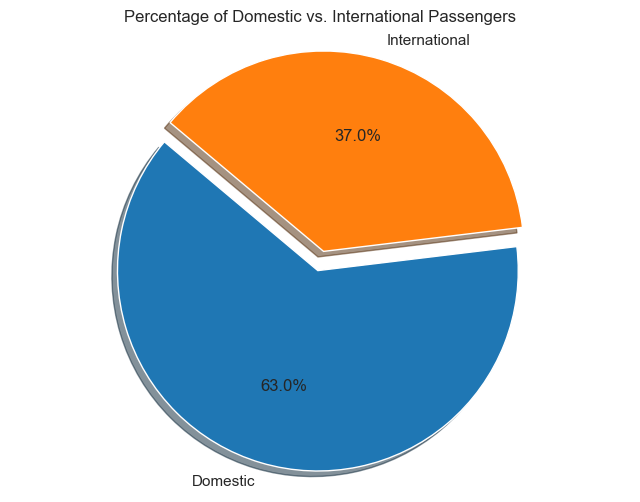

In [372]:
# create a pie chart
labels = ['Domestic', 'International']
sizes = [domestic_passengers, international_passengers]
colors = ['#1f77b4', '#ff7f0e']  # blue and orange, colorblind-friendly colors
explode = (0.1, 0)  # explode 1st slice (Domestic)

plt.figure(figsize=(8, 6))
plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%', shadow=True, startangle=140)
plt.axis('equal')  # equal aspect ratio ensures that pie is drawn as a circle
plt.title('Percentage of Domestic vs. International Passengers')

# save the image
plt.savefig('../figures/Percentage of Domestic vs. International Passengers.png')
plt.show()

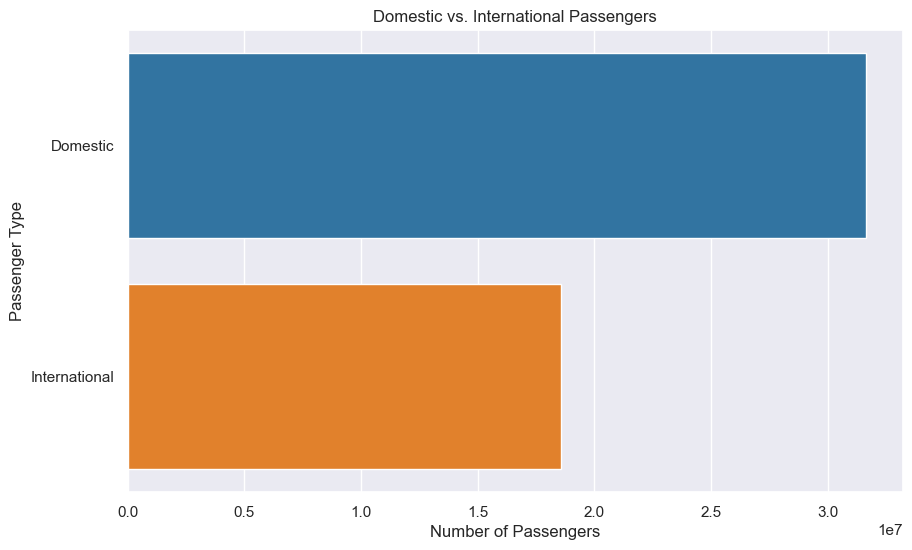

In [373]:
# create a more advanced horizontal bar plot
fig, ax = plt.subplots(figsize=(10, 6))
sns.barplot(x=[domestic_passengers, international_passengers], y=['Domestic', 'International'], palette=['#1f77b4', '#ff7f0e'])
plt.xlabel('Number of Passengers')
plt.ylabel('Passenger Type')
plt.title('Domestic vs. International Passengers')
plt.xticks(rotation=0)

# save the image
plt.savefig('../figures/Domestic vs. International Passengers.png')
plt.show()

**Transportation Infrastructure Connectivity**

Once you have the airport locations, you can calculate the accessibility score for each airport based on the connectivity of transport stops. One way to do this is by calculating the average distance from each transport stop to the airport.

We will use the following *GeoDataFrame()* [constructor](https://geopandas.org/reference/geopandas.GeoDataFrame.html):

The parameters of such constructor are:
* a dataframe (or dictionary)
* the CRS
* a geometry field expressed in WKT (eg. POINT (1,3))

The operations are:
- creation of a geometry column based on the WKT syntax
- mapping latitude and longitude on a POINT

In [374]:
geo_stops_sassari = gpd.GeoDataFrame(
    stops_sassari,
    crs = 'EPSG:4326',
    geometry = gpd.points_from_xy(stops_sassari.stop_lon, stops_sassari.stop_lat))

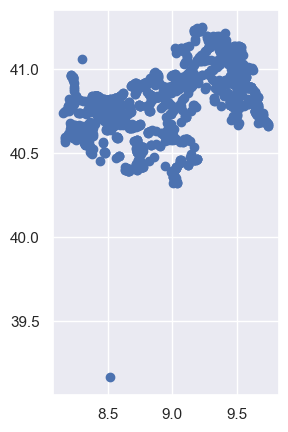

In [375]:
geo_stops_sassari.plot(figsize=(5,5))
plt.show()

In [376]:
geo_stops_sassari[geo_stops_sassari['stop_lat'] < 39.5]

,stop_id,stop_name,stop_lat,stop_lon,stop_comune,stop_type,geometry
2634,8312818,Stazione di Carbonia Serbariu,39.164195,8.512783,PORTO TORRES,Stazione Ferroviaria,POINT (8.51278 39.16419)


In [377]:
geo_stops_sassari = geo_stops_sassari.drop(geo_stops_sassari[(geo_stops_sassari['stop_lat'] < 39.5)].index)

In [378]:
# we can now save the GeoDataframe in a suitable format, as for instance GeoJSON
geo_stops_sassari.to_file('../data/processed/geo_stops_sassari.geojson', driver="GeoJSON")

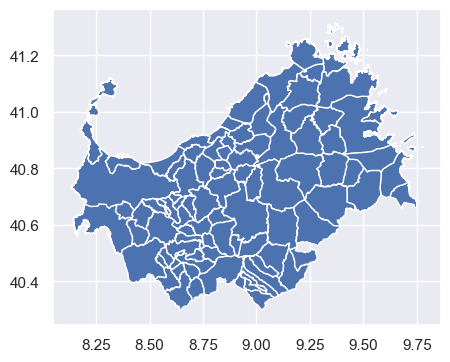

In [379]:
municipalities_sassari.plot(figsize=(5,5))
plt.show()

Let's now overlay the two layers. We need to use the same projection.

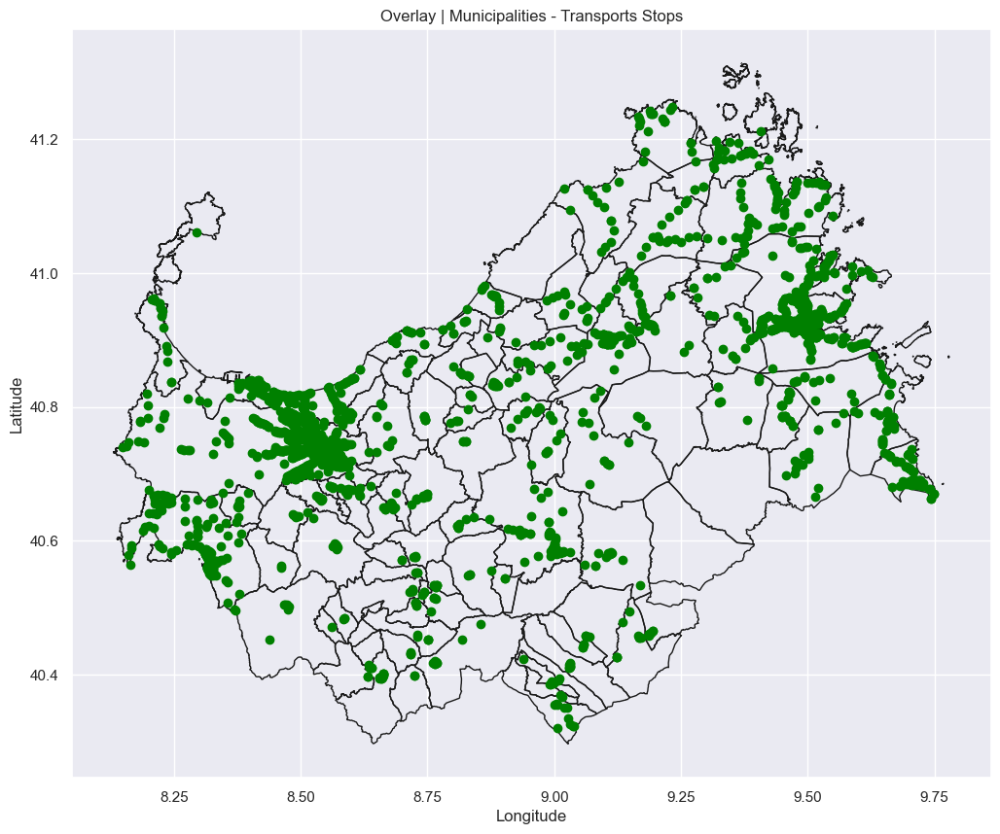

In [380]:
ax = municipalities_sassari.to_crs(epsg=4326).plot(edgecolor='k', facecolor='none', figsize=(15, 10))
geo_stops_sassari.plot(ax=ax,color="green")
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Overlay | Municipalities - Transports Stops')

# save image
plt.savefig('../figures/geo_stops_sassari.png', bbox_inches='tight', dpi=300)
plt.show()

In [381]:
geo_airports = gpd.GeoDataFrame(
    airports_df,
    crs = 'EPSG:4326',
    geometry = gpd.points_from_xy(airports_df.lon, airports_df.lat))

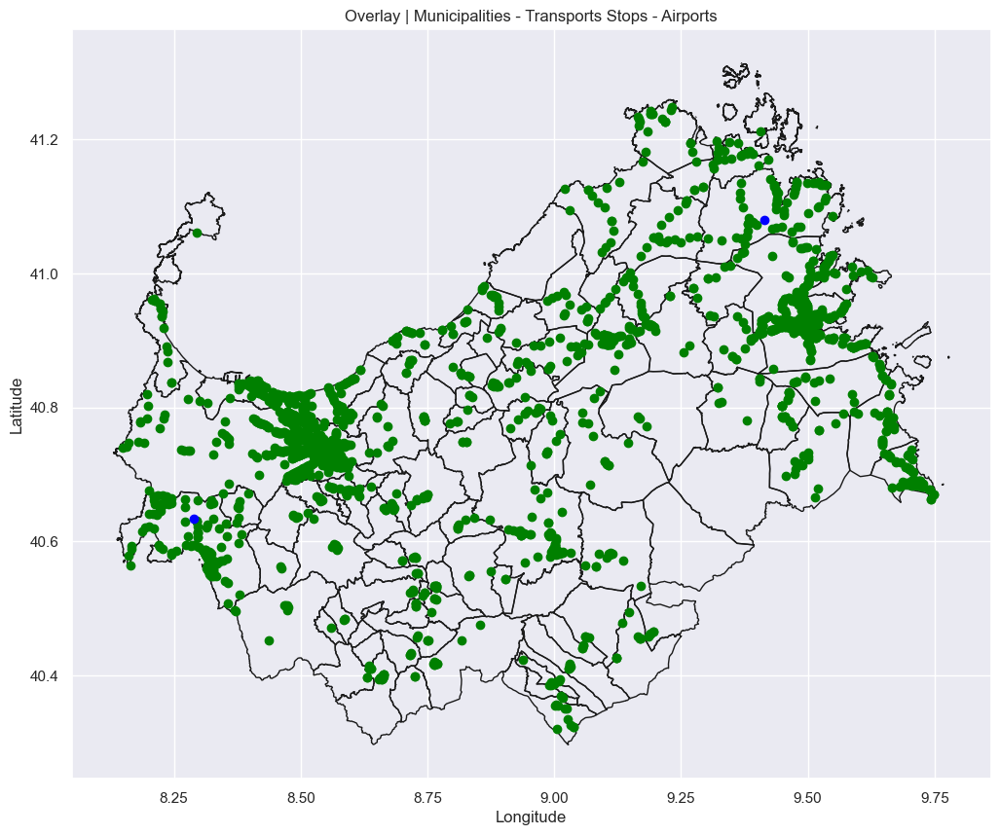

In [382]:
ax = municipalities_sassari.to_crs(epsg=4326).plot(edgecolor='k', facecolor='none', figsize=(15, 10))
geo_stops_sassari.plot(ax=ax,color="green")
geo_airports.plot(ax=ax,color="blue")

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Overlay | Municipalities - Transports Stops - Airports')

# save image
plt.savefig('../figures/geo_stops_sassari_airports.png', bbox_inches='tight', dpi=300)
plt.show()

Visualize the different types of stops, in particular bus, metro, and train

In [383]:
geo_stops_sassari.stop_type.unique()

array(['Fermata Autobus', 'Traghetto', 'Fermata Metropolitana',
       'Stazione Ferroviaria', 'Aeroporto', 'Porto'], dtype=object)

In [384]:
# bmt = bus - metro - train
bmt = ['Fermata Autobus', 'Fermata Metropolitana', 'Stazione Ferroviaria']

# select subset of DataFrame based on values in column
geo_stops_sassari_bmt = geo_stops_sassari[geo_stops_sassari['stop_type'].isin(bmt)]

In [385]:
geo_stops_sassari_bmt.stop_type.unique()

array(['Fermata Autobus', 'Fermata Metropolitana', 'Stazione Ferroviaria'],
      dtype=object)

c:\Users\FC\miniconda3\envs\smartcity\Lib\site-packages\geopandas\geodataframe.py:1538: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



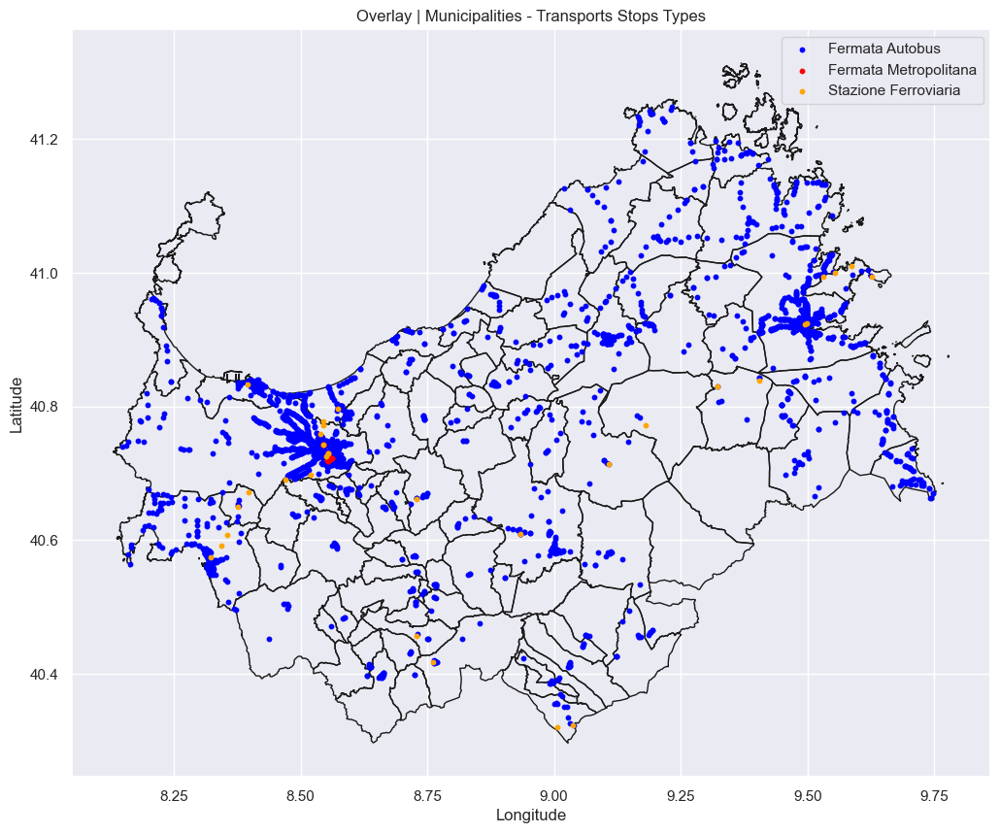

In [386]:
# create a color mapping dictionary for different stop types
stop_type_colors = {
    'Fermata Autobus': 'blue',
    'Fermata Metropolitana': 'red',
    'Stazione Ferroviaria': 'orange',
}

# convert the stop_type column to categorical to map colors efficiently
geo_stops_sassari_bmt['stop_type'] = geo_stops_sassari_bmt['stop_type'].astype('category')

# plotting
ax = municipalities_sassari.to_crs(epsg=4326).plot(edgecolor='k', facecolor='none', figsize=(15, 10))

# plot stops with different colors and smaller points based on stop_type
for stop_type, color in stop_type_colors.items():
    stop_type_df = geo_stops_sassari_bmt[geo_stops_sassari_bmt['stop_type'] == stop_type]
    stop_type_df.plot(ax=ax, color=color, label=stop_type, markersize=10)  # adjust the markersize as needed

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Overlay | Municipalities - Transports Stops Types')
plt.legend()

# save image
plt.savefig('../figures/Overlay Municipalities and Transports Stops Types.png', bbox_inches='tight', dpi=300)
plt.show()

Create copy for dataset division

In [387]:
stops_sassari_limited = stops_sassari.copy()

Calculate Accessibility Score by Distance (Kilometers)

In [388]:
from geopy.distance import geodesic

# calculate accessibility for each airport
for airport in airports:
    airport_name = airport['name']
    distances = []
    for index, row in stops_sassari.iterrows():
        stop_location = (row['stop_lat'], row['stop_lon'])
        airport_location = (airport['lat'], airport['lon'])
        distance = geodesic(stop_location, airport_location).kilometers
        distances.append(distance)
    stops_sassari[f'{airport_name}_accessibility'] = distances

In [389]:
# display the results
stops_sassari.head()

,stop_id,stop_name,stop_lat,stop_lon,stop_comune,stop_type,Olbia_accessibility,Alghero_accessibility
0,ATPSS_455,Fermata di Via De Cupis 32,40.761698,8.500294,SASSARI,Fermata Autobus,84.757512,22.792205
1,ASPO1051,Fermata di 1051 - Colcò agraria,40.905960,9.501480,OLBIA,Fermata Autobus,20.617758,106.680404
2,ASPO106,Fermata di 106 - Mameli 6,40.922990,9.496510,OLBIA,Fermata Autobus,18.702349,106.819719
3,ATPSS_757,Fermata di Via Lobina 7,40.746607,8.538608,SASSARI,Fermata Autobus,82.579074,24.501571
4,ATPSS_686,"Fermata di Via Barore Diegu, Ang. Via Branca",40.782744,8.463912,SASSARI,Fermata Autobus,86.624878,22.170749


Here, we calculate the distance between each transport stop and each airport using the geodesic function from the geopy.distance module. Then, we calculate the average accessibility score for each airport based on the distances.

Below, we compute the scatter plot with the limited version of the dataset, considering only x radius in kilometers for stops around each airport.

In [390]:
# define the radius in kilometers for stops around each airport
radius_around_airport_km = 5.0  # adjust as needed

# calculate accessibility for each airport, considering stops within the defined radius
for airport in airports:
    airport_name = airport['name']
    distances = []
    for index, row in stops_sassari_limited.iterrows():
        stop_location = (row['stop_lat'], row['stop_lon'])
        airport_location = (airport['lat'], airport['lon'])
        distance = geodesic(stop_location, airport_location).kilometers
        if distance <= radius_around_airport_km:
            distances.append(distance)
        else:
            distances.append(None)  # exclude stops outside the radius
    stops_sassari_limited[f'{airport_name}_accessibility'] = distances

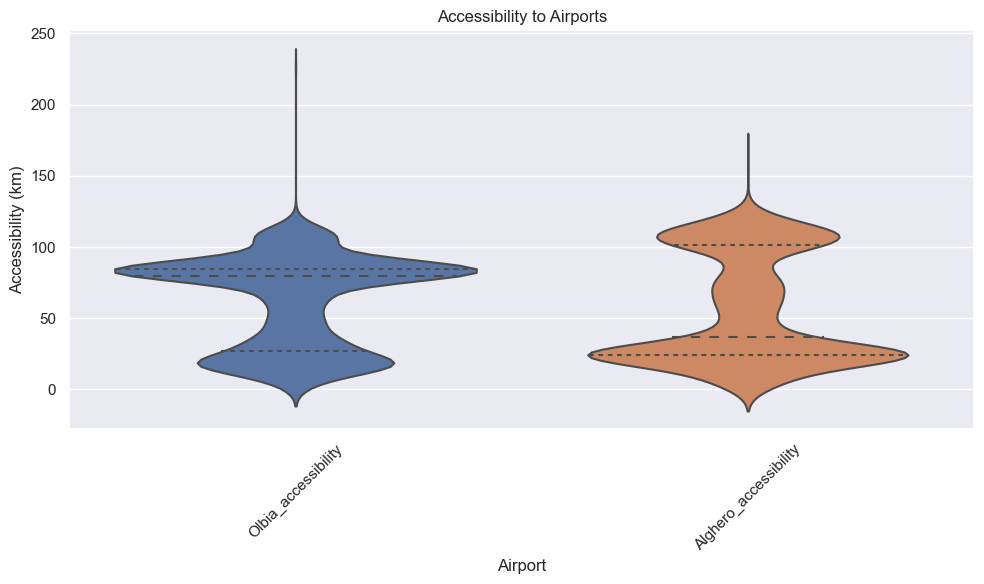

In [391]:
# create a violin plot to compare accessibility to different airports
plt.figure(figsize=(10, 6))
df_melted = pd.melt(stops_sassari, id_vars=['stop_id', 'stop_name', 'stop_lat', 'stop_lon', 'stop_comune', 'stop_type'], 
                    value_vars=[f'{airport["name"]}_accessibility' for airport in airports],
                    var_name='Airport', value_name='Accessibility (km)')

sns.violinplot(data=df_melted, x='Airport', y='Accessibility (km)', inner='quartile')
plt.xlabel('Airport')
plt.ylabel('Accessibility (km)')
plt.title('Accessibility to Airports')
plt.xticks(rotation=45)
plt.tight_layout()

# save the image
plt.savefig('../figures/Accessibility to Airports - Violin All.png')
plt.show()

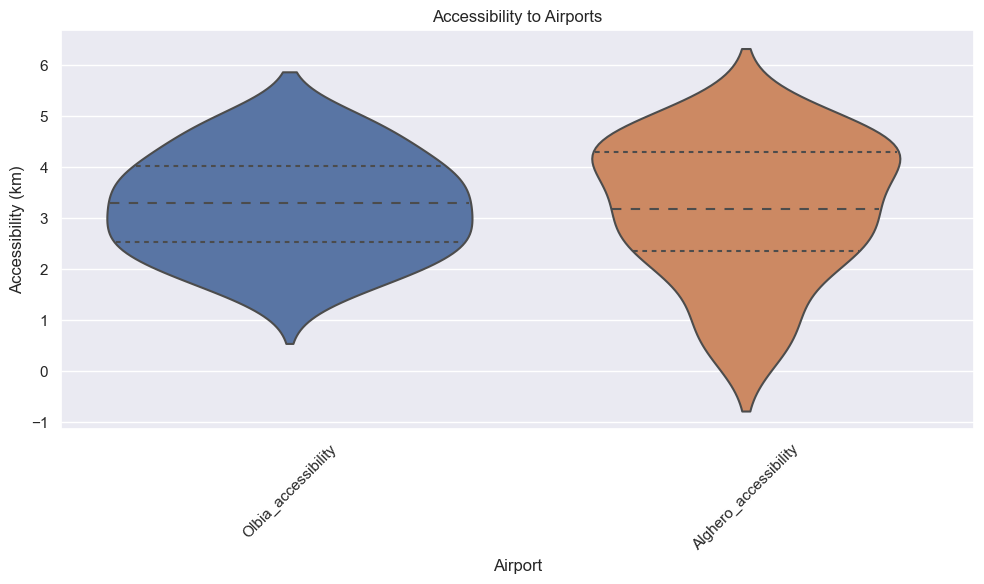

In [392]:
# create a violin plot to compare accessibility to different airports
plt.figure(figsize=(10, 6))
df_melted = pd.melt(stops_sassari_limited, id_vars=['stop_id', 'stop_name', 'stop_lat', 'stop_lon', 'stop_comune', 'stop_type'], 
                    value_vars=[f'{airport["name"]}_accessibility' for airport in airports],
                    var_name='Airport', value_name='Accessibility (km)')

sns.violinplot(data=df_melted, x='Airport', y='Accessibility (km)', inner='quartile')
plt.xlabel('Airport')
plt.ylabel('Accessibility (km)')
plt.title('Accessibility to Airports')
plt.xticks(rotation=45)
plt.tight_layout()

# save the image
plt.savefig('../figures/Accessibility to Airports - Violin Lim.png')
plt.show()

The box represents the interquartile range (IQR), which contains the middle 50% of the data. The median is shown as a line inside the box. The whiskers extend to 1.5 times the IQR or the data range, whichever is shorter. Data points beyond the whiskers are considered outliers and shown as individual points. Outliers, if present, are represented as individual points beyond the whiskers.

The longer the box, the larger the spread of data within that group. If the median line is not in the center of the box, the data might be skewed. Outliers beyond the whiskers might indicate extreme values.

In [393]:
# calculate average accessibility score for each airport
average_scores = {}
for airport in airports:
    airport_name = airport['name']
    avg_score = stops_sassari[f'{airport_name}_accessibility'].mean()
    average_scores[airport_name] = avg_score

# display the average accessibility scores
print("Average Accessibility Scores:")
for airport_name, avg_score in average_scores.items():
    print(f"{airport_name}: {avg_score:.2f} kilometers")

Average Accessibility Scores:
Olbia: 61.99 kilometers
Alghero: 55.32 kilometers


In [394]:
# calculate average accessibility score for each airport
average_scores = {}
for airport in airports:
    airport_name = airport['name']
    avg_score = stops_sassari_limited[f'{airport_name}_accessibility'].mean()
    average_scores[airport_name] = avg_score

# display the average accessibility scores
print("Average Accessibility Scores:")
for airport_name, avg_score in average_scores.items():
    print(f"{airport_name}: {avg_score:.2f} kilometers")

Average Accessibility Scores:
Olbia: 3.25 kilometers
Alghero: 3.19 kilometers


This represents the average accessibility score across all transport stops for Olbia Airport and Alghero Airport.

The average accessibility score in kilometers represents the average distance between the transport stops and the airport. It's a measure of how "connected" the airport is to the surrounding areas by public transportation. A lower value indicates better accessibility, meaning that the transport stops are, on average, closer to the airport.

For example, if the average accessibility score for Olbia Airport is 5 kilometers, it means that, on average, the transport stops in the dataset are about 5 kilometers away from Olbia Airport. This can be interpreted as follows:

- Low Accessibility: If the average score is a small value, such as 2 kilometers, it suggests that the public transportation stops are very close to the airport, indicating high accessibility.

- Medium Accessibility: If the average score is moderate, say around 5 to 10 kilometers, it indicates a reasonable level of accessibility, where the transport stops are moderately close to the airport.

- High Accessibility: If the average score is larger, such as 15 kilometers or more, it suggests that the public transportation stops are relatively far from the airport, indicating lower accessibility.

Number of Stops within a Radius

Calculate the number of transport stops within a certain radius of each airport.

In [395]:
# define the radius in kilometers
radius_km = 5.0  # adjust as needed

# calculate number of stops within the radius for each airport
for airport in airports:
    airport_name = airport['name']
    num_stops_within_radius = 0
    for index, row in stops_sassari.iterrows():
        stop_location = (row['stop_lat'], row['stop_lon'])
        airport_location = (airport['lat'], airport['lon'])
        distance = geodesic(stop_location, airport_location).kilometers
        if distance <= radius_km:
            num_stops_within_radius += 1
    airport['num_stops_within_radius'] = num_stops_within_radius

# display the results
print("Number of Stops within a Radius:")
for airport in airports:
    print(f"{airport['name']}: {airport['num_stops_within_radius']} stops within {radius_km} km")

Number of Stops within a Radius:
Olbia: 28 stops within 5.0 km
Alghero: 30 stops within 5.0 km


In [396]:
# define the radius in kilometers
radius_km = 2.5  # adjust as needed

# calculate number of stops within the radius for each airport
for airport in airports:
    airport_name = airport['name']
    num_stops_within_radius = 0
    for index, row in stops_sassari.iterrows():
        stop_location = (row['stop_lat'], row['stop_lon'])
        airport_location = (airport['lat'], airport['lon'])
        distance = geodesic(stop_location, airport_location).kilometers
        if distance <= radius_km:
            num_stops_within_radius += 1
    airport['num_stops_within_radius'] = num_stops_within_radius

# display the results
print("Number of Stops within a Radius:")
for airport in airports:
    print(f"{airport['name']}: {airport['num_stops_within_radius']} stops within {radius_km} km")

Number of Stops within a Radius:
Olbia: 7 stops within 2.5 km
Alghero: 10 stops within 2.5 km


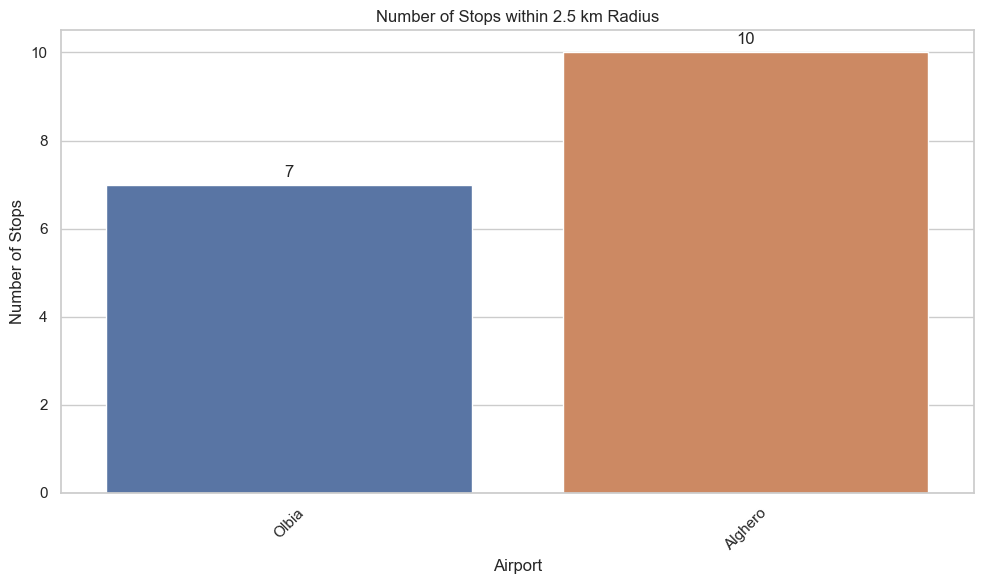

In [397]:
# create a bar plot with annotations to show the number of stops within the radius
plt.figure(figsize=(10, 6))
sns.set_theme(style="whitegrid")
ax = sns.barplot(x=[airport['name'] for airport in airports], y=[airport['num_stops_within_radius'] for airport in airports])
plt.xlabel('Airport')
plt.ylabel('Number of Stops')
plt.title(f'Number of Stops within {radius_km} km Radius')
plt.xticks(rotation=45)

for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 9), 
                textcoords = 'offset points')

plt.tight_layout()

# save the image
plt.savefig('../figures/Number of Stops within km Radius.png')
plt.show()

**Stop Density**

In [398]:
stops_sassari['stop_type'].unique()

array(['Fermata Autobus', 'Traghetto', 'Fermata Metropolitana',
       'Stazione Ferroviaria', 'Aeroporto', 'Porto'], dtype=object)

In [399]:
print(stops_sassari[stops_sassari['stop_type'] == 'Aeroporto'].shape)
print(stops_sassari[stops_sassari['stop_type'] == 'Porto'].shape)
print(stops_sassari[stops_sassari['stop_type'] == 'Traghetto'].shape)
print(stops_sassari[stops_sassari['stop_type'] == 'Fermata Metropolitana'].shape)
print(stops_sassari[stops_sassari['stop_type'] == 'Stazione Ferroviaria'].shape)
print(stops_sassari[stops_sassari['stop_type'] == 'Fermata Autobus'].shape)

(2, 8)
(2, 8)
(4, 8)
(16, 8)
(33, 8)
(2653, 8)


In [400]:
bus_stops_sassari = stops_sassari[stops_sassari['stop_type'] == 'Fermata Autobus']

Group the transport stops data by the 'stop_comune' column (municipality) and count the number of stops in each municipality.

In [401]:
stops_by_municipality = bus_stops_sassari.groupby('stop_comune').size().reset_index(name='stop_count')

In [402]:
stops_by_municipality

,stop_comune,stop_count
0,AGGIUS,13
1,AGLIENTU,16
2,ALGHERO,180
3,ANELA,4
4,ARDARA,7
...,...,...
82,URI,6
83,USINI,8
84,VALLEDORIA,8
85,VIDDALBA,4


In [403]:
stops_by_municipality.sort_values('stop_count', ascending=False).head(10)

,stop_comune,stop_count
68,SASSARI,843
48,OLBIA,492
2,ALGHERO,180
76,TEMPIO PAUSANIA,112
60,PORTO TORRES,103
53,OZIERI,80
73,SORSO,77
5,ARZACHENA,64
17,BUDONI,51
64,SAN TEODORO,37


In [404]:
stops_by_municipality.sort_values('stop_count', ascending=True).head(10)

,stop_comune,stop_count
42,MONTELEONE ROCCA DORIA,1
66,SANTA MARIA COGHINAS,1
45,MUROS,2
54,PADRIA,2
34,ITTIREDDU,2
62,PUTIFIGARI,2
7,BANARI,2
9,BERCHIDDA,2
70,SEMESTENE,2
36,LAERRU,3


Merge the stops count data with the municipalities geodataframe based on the municipality name (stop_comune).

In [405]:
municipalities_sassari_capital = municipalities_sassari.copy()
municipalities_sassari_capital['COMUNE'] = municipalities_sassari_capital['COMUNE'].str.upper()

In [406]:
merged_stops_municipalites = municipalities_sassari_capital.merge(stops_by_municipality, left_on='COMUNE', right_on='stop_comune', how='left')

In [407]:
merged_stops_municipalites[['COMUNE', 'SHAPE_LENG', 'geometry', 'stop_comune', 'stop_count']].head()

,COMUNE,SHAPE_LENG,geometry,stop_comune,stop_count
0,BANARI,22713.497329,"POLYGON ((8.66935 40.60099, 8.66976 40.60086, ...",BANARI,2.0
1,BURGOS,32641.249234,"POLYGON ((8.94247 40.43254, 8.94369 40.43137, ...",BURGOS,3.0
2,PADRIA,41042.452979,"POLYGON ((8.58662 40.44676, 8.58721 40.44671, ...",PADRIA,2.0
3,MONTELEONE ROCCA DORIA,20321.212472,"POLYGON ((8.54566 40.49683, 8.54590 40.49596, ...",MONTELEONE ROCCA DORIA,1.0
4,COSSOINE,41227.178497,"POLYGON ((8.64223 40.47028, 8.64241 40.46987, ...",COSSOINE,4.0


Calculate the area of each municipality and then calculate the bus stop density by dividing the number of stops by the municipality's area.

In [408]:
# make sure the GeoDataFrame is in EPSG:4326 CRS (WGS 84)
merged_stops_municipalites = merged_stops_municipalites.to_crs(epsg=4326)

In [409]:
# reproject the GeoDataFrame to a suitable projected CRS that uses meters (e.g., UTM Zone 32N, EPSG:32632)
merged_stops_municipalites = merged_stops_municipalites.to_crs(epsg=32632)  # UTM Zone 32N

In [410]:
merged_stops_municipalites['municipality_area'] = merged_stops_municipalites.geometry.area / 10**6  # convert to square kilometers
merged_stops_municipalites['bus_stop_density'] = merged_stops_municipalites['stop_count'] / merged_stops_municipalites['municipality_area']

In [411]:
merged_stops_municipalites[['COMUNE', 'bus_stop_density']]

,COMUNE,bus_stop_density
0,BANARI,0.094114
1,BURGOS,0.165957
2,PADRIA,0.041327
3,MONTELEONE ROCCA DORIA,0.074706
4,COSSOINE,0.102118
...,...,...
87,PERFUGAS,0.246385
88,MARA,0.268192
89,SILIGO,0.092063
90,LOIRI PORTO SAN PAOLO,0.185623


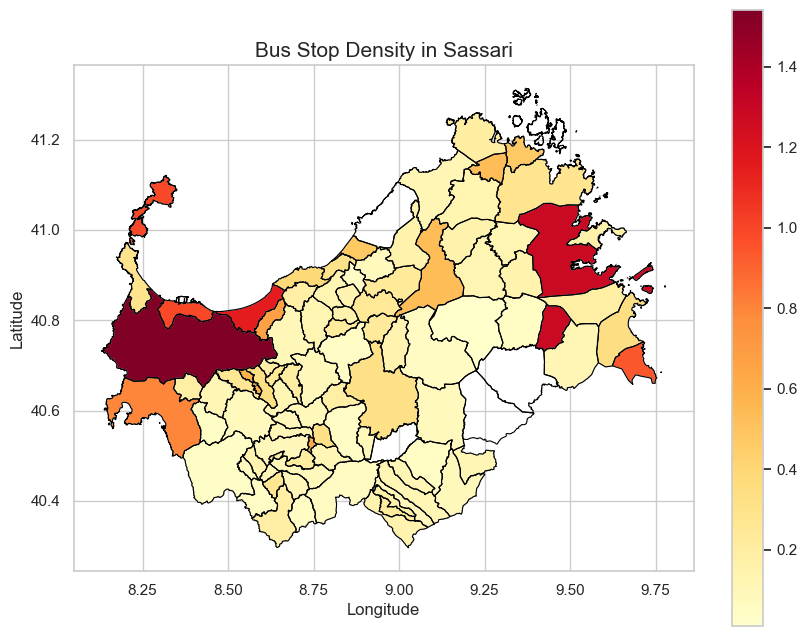

In [412]:
# set the proper coordinate reference system (CRS) for visualization (EPSG:4326)
merged_stops_municipalites = merged_stops_municipalites.to_crs(epsg=4326)

# plot the choropleth map
fig, ax = plt.subplots(1, 1, figsize=(10, 8))

# plot the municipalities boundaries
merged_stops_municipalites.boundary.plot(ax=ax, linewidth=0.8, color='black')

# plot the choropleth map for bus stop density
merged_stops_municipalites.plot(column='bus_stop_density', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)

# add title and labels
ax.set_title('Bus Stop Density in Sassari', fontdict={'fontsize': '15', 'fontweight' : '3'})
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# save the image
plt.savefig('../figures/Bus Stop Density in Sassari.png')
plt.show()

In [413]:
import plotly.express as px
import plotly.graph_objects as go

# convert to EPSG:4326 (WGS 84)
merged_stops_municipalites = merged_stops_municipalites.to_crs(epsg=4326)

# define a bounding box for Sardinia in EPSG:4326 (WGS 84) coordinates
sardinia_bbox = [8.0, 9.5, 39.0, 41.5]

# create an interactive choropleth map using Plotly
fig = px.choropleth(
    merged_stops_municipalites,
    geojson=merged_stops_municipalites.geometry.__geo_interface__,
    locations=merged_stops_municipalites.index,
    color='bus_stop_density',
    color_continuous_scale='YlOrRd',
    labels={'bus_stop_density': 'Bus Stop Density'},
    hover_name='COMUNE',  # display municipality name on hover
    hover_data={'bus_stop_density': ':.2f'},  # display density value on hover
    title='Bus Stop Density in Sardinia',
    range_color=[0, merged_stops_municipalites['bus_stop_density'].max()]
)

# customize layout options to focus on Sardinia
fig.update_geos(
    fitbounds="locations",  # fit the map to the provided locations
    projection_type="mercator",  # choose a projection type
    visible=False,  # hide the base map
    showcoastlines=False,  # hide coastlines for a cleaner look
    showland=True,  # show land areas
    showocean=True,  # show ocean areas
    showrivers=False,  # hide rivers
    showlakes=False  # hide lakes
)

# set the initial x and y axis ranges for zoom
x_range = [100, 200]
y_range = [0, 100]

# update the layout to set initial axis ranges and figure size
layout = go.Layout(
    xaxis=dict(range=x_range),
    yaxis=dict(range=y_range),
    geo=fig['layout']['geo'],  # preserve the geo settings
    width=1000,  # set the width of the figure
    height=800  # set the height of the figure
)

# update the figure's layout
fig.update_layout(layout)

# save the interactive HTML plot
fig.write_html('../figures/Bus_Stop_Density_Plotly.html')

# show the plot
fig.show()

**Sea Accessibility Index**

In [414]:
beach_systems.columns

Index(['idFeature', 'tipoElCod', 'tipoElDesc', 'geometry'], dtype='object')

In [415]:
provinces = gpd.read_file('../data/processed/provinces_sardinia.geojson')
sassari = provinces[provinces['COD_PROV']==90]

In [416]:
municipalities_sassari = gpd.read_file('../data/processed/municipalities_sassari.geojson')

In [417]:
# set the CRS for the GeoDataFrame
beach_systems.crs = "EPSG:4326"

In [418]:
from shapely.wkt import loads

# convert the data to a GeoDataFrame and convert geometry strings to actual geometry objects
beach_systems = gpd.GeoDataFrame(beach_systems, geometry=beach_systems["geometry"].apply(lambda x: loads(x)))

# use the representative_point() method to get the representative points for each polygon
beach_systems["representative_point"] = beach_systems["geometry"].apply(lambda polygon: polygon.representative_point())

# extract the coordinates of the representative points
representative_points = beach_systems["representative_point"].apply(lambda point: (point.x, point.y))

# mow, `representative_points` contains the representative points for each beach
print(representative_points)

0       (9.435646761240871, 41.13642553541705)
1       (9.276287904344365, 39.21388206617405)
2      (9.297924216959927, 39.212894668983665)
3       (9.337758035327896, 41.18752230587841)
4       (9.369646784515481, 39.17481673510163)
                        ...                   
298     (9.596416187839235, 39.34259123762967)
299     (9.171279919655996, 41.17698869029316)
300     (9.399335160927013, 41.24132258238602)
301    (8.664186668148476, 38.913433570310914)
302     (9.457146175467702, 41.22145406592629)
Name: representative_point, Length: 303, dtype: object


In [419]:
# extract latitude and longitude from the representative_point column
beach_systems["latitude"] = beach_systems["representative_point"].apply(lambda point: point.y)
beach_systems["longitude"] = beach_systems["representative_point"].apply(lambda point: point.x)

# print the modified GeoDataFrame
beach_systems.head()

,idFeature,tipoElCod,tipoElDesc,geometry,representative_point,latitude,longitude
0,13,6,Sistemi di spiaggia,"POLYGON ((9.43613 41.13590, 9.43594 41.13601, ...",POINT (9.43565 41.13643),41.136426,9.435647
1,15,6,Sistemi di spiaggia,"POLYGON ((9.28566 39.21405, 9.28626 39.21380, ...",POINT (9.27629 39.21388),39.213882,9.276288
2,16,6,Sistemi di spiaggia,"POLYGON ((9.29937 39.21181, 9.29935 39.21185, ...",POINT (9.29792 39.21289),39.212895,9.297924
3,17,6,Sistemi di spiaggia,"POLYGON ((9.33826 41.18949, 9.33825 41.18939, ...",POINT (9.33776 41.18752),41.187522,9.337758
4,18,6,Sistemi di spiaggia,"POLYGON ((9.36524 39.17688, 9.36530 39.17662, ...",POINT (9.36965 39.17482),39.174817,9.369647


In [420]:
geo_beaches = gpd.GeoDataFrame(
    beach_systems,
    crs = 'EPSG:4326',
    geometry = gpd.points_from_xy(beach_systems.longitude, beach_systems.latitude))

In [421]:
geo_beaches.columns

Index(['idFeature', 'tipoElCod', 'tipoElDesc', 'geometry',
       'representative_point', 'latitude', 'longitude'],
      dtype='object')

In [422]:
geo_beaches = geo_beaches[['idFeature', 'tipoElCod', 'tipoElDesc', 'geometry', 'latitude', 'longitude']]

In [423]:
# we can now save the GeoDataframe in a suitable format, as for instance GeoJSON
geo_beaches.to_file('../data/processed/geo_beaches.geojson', driver="GeoJSON")

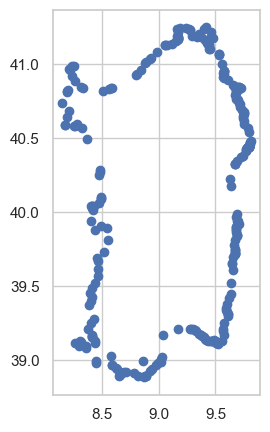

In [424]:
geo_beaches.plot(figsize=(5,5))
plt.show()

In [425]:
from shapely.geometry import Polygon

# define the bounding box coordinates for the province of Sassari
xmin, ymin = 8.00, 40.25  # Southwest corner
xmax, ymax = 10.00, 42.50  # Northeast corner

# define a polygon representing the region of interest
sassari_polygon = Polygon([(xmin, ymin), (xmax, ymin), (xmax, ymax), (xmin, ymax)])

# filter points that are within the region
geo_beaches = geo_beaches[geo_beaches.geometry.within(sassari_polygon)]

# print the filtered GeoDataFrame
print(geo_beaches)

     idFeature  tipoElCod           tipoElDesc                  geometry  \
0           13          6  Sistemi di spiaggia  POINT (9.43565 41.13643)   
3           17          6  Sistemi di spiaggia  POINT (9.33776 41.18752)   
8           53          6  Sistemi di spiaggia  POINT (9.67576 40.32967)   
9           58          6  Sistemi di spiaggia  POINT (9.79844 40.45340)   
12          63          6  Sistemi di spiaggia  POINT (8.25852 40.58449)   
..         ...        ...                  ...                       ...   
296       3275          6  Sistemi di spiaggia  POINT (9.41416 41.25043)   
297       2625          6  Sistemi di spiaggia  POINT (9.16065 41.23614)   
299       3432          6  Sistemi di spiaggia  POINT (9.17128 41.17699)   
300       3434          6  Sistemi di spiaggia  POINT (9.39934 41.24132)   
302       2911          6  Sistemi di spiaggia  POINT (9.45715 41.22145)   

      latitude  longitude  
0    41.136426   9.435647  
3    41.187522   9.337758  
8  

In [426]:
geo_beaches.columns

Index(['idFeature', 'tipoElCod', 'tipoElDesc', 'geometry', 'latitude',
       'longitude'],
      dtype='object')

In [427]:
geo_beaches[['idFeature', 'geometry', 'latitude', 'longitude']].head()

,idFeature,geometry,latitude,longitude
0,13,POINT (9.43565 41.13643),41.136426,9.435647
3,17,POINT (9.33776 41.18752),41.187522,9.337758
8,53,POINT (9.67576 40.32967),40.329671,9.675759
9,58,POINT (9.79844 40.45340),40.453399,9.798441
12,63,POINT (8.25852 40.58449),40.584490,8.258521


In [428]:
municipalities_sassari[['COMUNE', 'geometry']].head()

,COMUNE,geometry
0,Banari,"POLYGON ((8.66935 40.60099, 8.66976 40.60086, ..."
1,Burgos,"POLYGON ((8.94247 40.43254, 8.94369 40.43137, ..."
2,Padria,"POLYGON ((8.58662 40.44676, 8.58721 40.44671, ..."
3,Monteleone Rocca Doria,"POLYGON ((8.54566 40.49683, 8.54590 40.49596, ..."
4,Cossoine,"POLYGON ((8.64223 40.47028, 8.64241 40.46987, ..."


In [429]:
import folium
from folium.plugins import MarkerCluster

# Create a folium map centered at a specific location
map_center = [41.136426, 9.435647]  # You can choose a suitable center for your map
m = folium.Map(location=map_center, zoom_start=10)

# Create a marker cluster layer for beaches
beach_cluster = MarkerCluster().add_to(m)

# Add beach markers to the cluster layer
for index, row in geo_beaches.iterrows():
    beach_popup = f"Beach ID: {row['idFeature']}"
    folium.Marker([row['latitude'], row['longitude']], popup=beach_popup).add_to(beach_cluster)

# Add municipality polygons to the map
folium.GeoJson(data=municipalities_sassari,
               style_function=lambda x: {'fillColor': 'blue', 'color': 'black'}).add_to(m)

# Display the map
m.save('../figures/interactive_map_beaches.html')

In [430]:
beaches_outside = [336, 335, 534, 295, 540, 255, 468, 1863, 435, 95, 58, 98, 465, 2337, 466, 507, 99, 2283, 508, 2339, 2338, 389, 396, 150, 149, 416, 71, 88, 501, 530, 97, 341, 53, 54, 414, 485, 96]
len(beaches_outside)

37

In [431]:
print(geo_beaches.shape)
print('')
# Remove rows with values from the list
geo_beaches = geo_beaches[~geo_beaches['idFeature'].isin(beaches_outside)]
print(geo_beaches.shape)

(164, 6)

(127, 6)


In [432]:
# we can now save the GeoDataframe in a suitable format, as for instance GeoJSON
geo_beaches.to_file('../data/processed/geo_beaches_sassari.geojson', driver="GeoJSON")

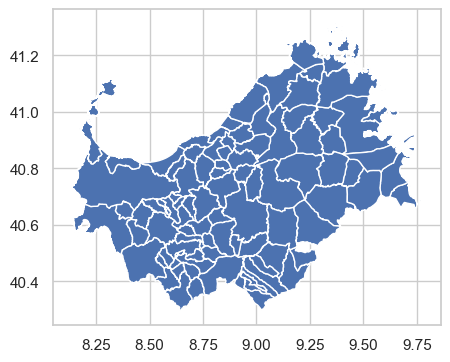

In [433]:
municipalities_sassari.plot(figsize=(5,5))
plt.show()

Let's now overlay the two layers. We need to use the same projection.

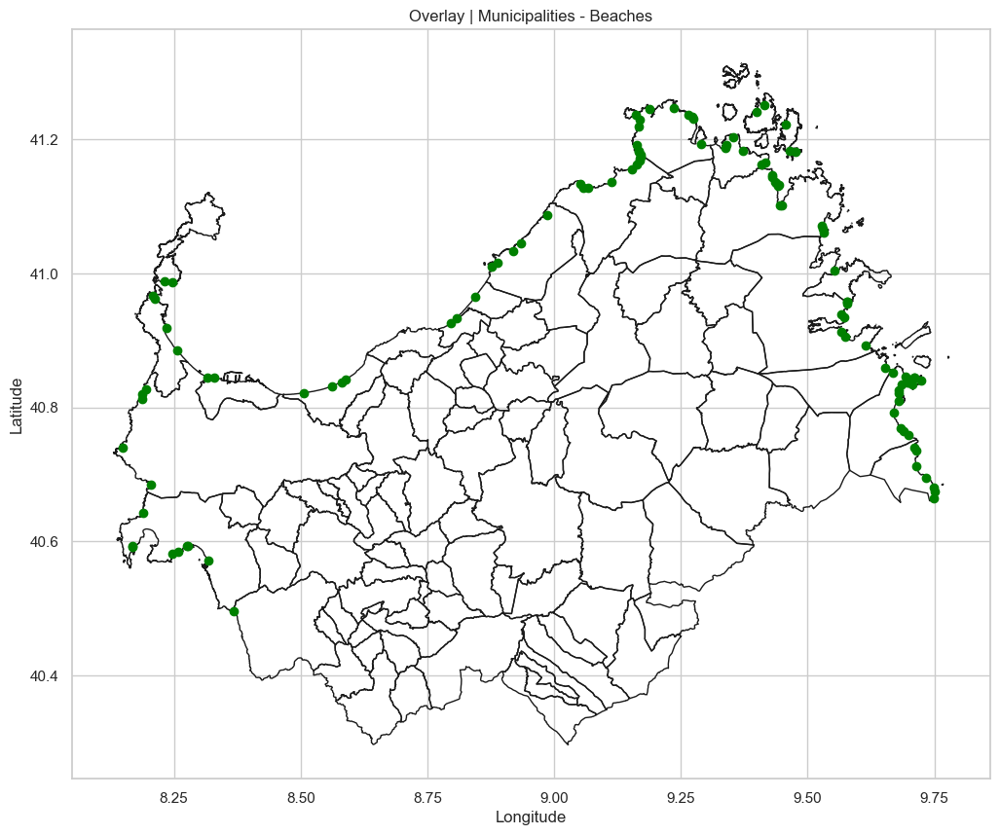

In [434]:
ax = municipalities_sassari.to_crs(epsg=4326).plot(edgecolor='k', facecolor='none', figsize=(15, 10))
geo_beaches.plot(ax=ax,color="green")
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Overlay | Municipalities - Beaches')

# save image
plt.savefig('../figures/geo_beaches.png', bbox_inches='tight', dpi=300)
plt.show()

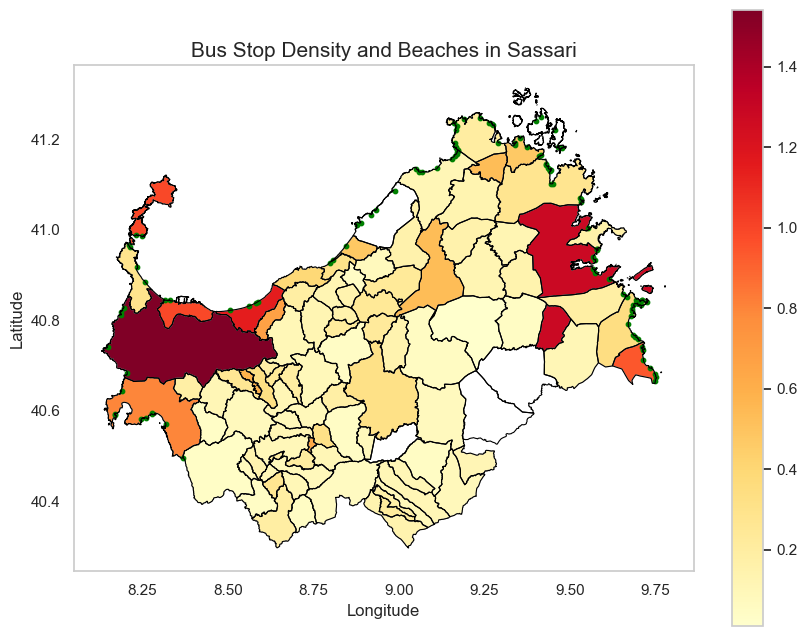

In [435]:
# set the proper coordinate reference system (CRS) for visualization (EPSG:4326)
merged_stops_municipalites = merged_stops_municipalites.to_crs(epsg=4326)

# plot the choropleth map
fig, ax = plt.subplots(1, 1, figsize=(10, 8))

# plot the municipalities boundaries
merged_stops_municipalites.boundary.plot(ax=ax, linewidth=0.8, color='black')

# plot the choropleth map for bus stop density
merged_stops_municipalites.plot(column='bus_stop_density', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)

# plot beach points
geo_beaches.plot(ax=ax,color="green", markersize=10)

# add title and labels
ax.set_title('Bus Stop Density and Beaches in Sassari', fontdict={'fontsize': '15', 'fontweight' : '3'})
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# remove grid
ax.grid(False)

# save the image
plt.savefig('../figures/Bus Stop Density and Beaches in Sassari.png')
plt.show()

Calculate Proximity - For each beach, calculate the distance to the nearest bus stop using the GeoPandas distance method

In [436]:
geo_stops_sassari

,stop_id,stop_name,stop_lat,stop_lon,stop_comune,stop_type,geometry
0,ATPSS_455,Fermata di Via De Cupis 32,40.761698,8.500294,SASSARI,Fermata Autobus,POINT (8.50029 40.76170)
1,ASPO1051,Fermata di 1051 - Colcò agraria,40.905960,9.501480,OLBIA,Fermata Autobus,POINT (9.50148 40.90596)
2,ASPO106,Fermata di 106 - Mameli 6,40.922990,9.496510,OLBIA,Fermata Autobus,POINT (9.49651 40.92299)
3,ATPSS_757,Fermata di Via Lobina 7,40.746607,8.538608,SASSARI,Fermata Autobus,POINT (8.53861 40.74661)
4,ATPSS_686,"Fermata di Via Barore Diegu, Ang. Via Branca",40.782744,8.463912,SASSARI,Fermata Autobus,POINT (8.46391 40.78274)
...,...,...,...,...,...,...,...
2705,212004,Fermata di S.Lorenzo,40.681322,9.682058,BUDONI,Fermata Autobus,POINT (9.68206 40.68132)
2706,ASPO903,Fermata di 903 - SS125 Padrongianus,40.902080,9.540240,OLBIA,Fermata Autobus,POINT (9.54024 40.90208)
2707,ASPO2034,Fermata di 2034 - Via San Vittore Lato Via Plebi,40.958100,9.475610,OLBIA,Fermata Autobus,POINT (9.47561 40.95810)
2708,B_7628,Fermata di OLBIA ISTITUTO AGRARIO,40.904933,9.501372,OLBIA,Fermata Autobus,POINT (9.50137 40.90493)


In [437]:
geo_bus_stops_sassari = geo_stops_sassari[geo_stops_sassari['stop_type'] == 'Fermata Autobus']

In [438]:
type(geo_bus_stops_sassari)

geopandas.geodataframe.GeoDataFrame

In [439]:
# we can now save the GeoDataframe in a suitable format, as for instance GeoJSON
geo_bus_stops_sassari.to_file('../data/processed/geo_bus_stops_sassari.geojson', driver="GeoJSON")

In [440]:
# make sure the GeoDataFrame is in EPSG:4326 CRS (WGS 84)
geo_bus_stops_sassari = geo_bus_stops_sassari.to_crs(epsg=4326)
geo_beaches = geo_beaches.to_crs(epsg=4326)

# reproject the GeoDataFrame to a suitable projected CRS that uses meters (e.g., UTM Zone 32N, EPSG:32632)
geo_bus_stops_sassari = geo_bus_stops_sassari.to_crs(epsg=32632)  # UTM Zone 32N
geo_beaches = geo_beaches.to_crs(epsg=32632)  # UTM Zone 32N

In [441]:
def calculate_nearest_distance(row):
    nearest_stop = geo_bus_stops_sassari.geometry.distance(row['geometry']).idxmin()
    return geo_bus_stops_sassari.loc[nearest_stop, 'geometry'].distance(row['geometry'])

geo_beaches['nearest_distance'] = geo_beaches.apply(calculate_nearest_distance, axis=1)

Normalize the distances to a score between 0 and 1. You can use various methods for normalization, such as min-max scaling.

In [442]:
def normalize_distance(distance, max_distance):
    return 1 - (distance / max_distance)

max_distance = geo_beaches['nearest_distance'].max()
geo_beaches['accessibility_score'] = geo_beaches['nearest_distance'].apply(normalize_distance, args=(max_distance,))

Calculate the average accessibility score for all beaches.

In [443]:
sea_accessibility_index = geo_beaches['accessibility_score'].mean()

In [444]:
sea_accessibility_index

0.8035409696751454

The Sea Accessibility Index you've calculated represents the level of ease with which individuals can access beaches in Sardinia via bus transportation. It's a quantitative measure that reflects the proximity of bus stops to key facilities, in this case, the beaches. A higher value of the index implies better accessibility to the beaches from bus stops, while a lower value indicates poorer accessibility.

The index value ranges between 0 and 1. A value of 1 signifies perfect accessibility, meaning that all beaches are located very close to bus stops. Conversely, a value of 0 suggests that beaches are located far away from bus stops, resulting in poor accessibility.

The Sea Accessibility Index could be inflated if multiple bus stops are clustered around certain beaches while many other beaches are not well-served by any stops.

In [445]:
# calculate the CV for the accessibility scores of all beaches
accessibility_mean = geo_beaches['accessibility_score'].mean()
accessibility_std = geo_beaches['accessibility_score'].std()
coefficient_of_variation = accessibility_std / accessibility_mean

The Coefficient of Variation considers the standard deviation of the accessibility scores relative to their mean. It provides an idea of the spread or variability of the accessibility scores around the mean. Higher values of the CV indicate greater variability in accessibility scores.

In [446]:
coefficient_of_variation

0.23247649187844546

Calculate a weighted index that takes into account both the average accessibility score and the coefficient of variation. Use a weighted sum where the CV has a higher weight for lower values, indicating that it prioritize beaches with more consistent accessibility scores.

In [447]:
weighted_index = (1 - coefficient_of_variation) * accessibility_mean

Here, (1 - coefficient_of_variation) ensures that higher CV values result in lower weights.

This modified weighted index gives more importance to beaches with consistent accessibility scores while still considering the average accessibility. If a beach has low accessibility scores across different bus stops, it will have a lower weighted index. On the other hand, if a beach has high accessibility scores across a variety of bus stops, it will have a higher weighted index.

In [448]:
weighted_index

0.6167365839644633

Interpreting the Weighted Index:

- A higher weighted index indicates that the beaches, on average, are well-served by bus stops and have consistent accessibility scores across different stops.
- A lower weighted index suggests that the accessibility to the beaches is more variable or that there are beaches with low accessibility scores.

**Bus Stop Location in Relation to Population Density**

In [449]:
'''
geo_stops_sassari = gpd.GeoDataFrame(
    stops_sassari,
    crs = 'EPSG:4326',
    geometry = gpd.points_from_xy(stops_sassari.stop_lon, stops_sassari.stop_lat))
'''

"\ngeo_stops_sassari = gpd.GeoDataFrame(\n    stops_sassari,\n    crs = 'EPSG:4326',\n    geometry = gpd.points_from_xy(stops_sassari.stop_lon, stops_sassari.stop_lat))\n"

In [450]:
# geo_bus_stops_sassari = geo_stops_sassari[geo_stops_sassari['stop_type'] == 'Fermata Autobus']

In [451]:
geo_bus_stops_sassari.columns

Index(['stop_id', 'stop_name', 'stop_lat', 'stop_lon', 'stop_comune',
       'stop_type', 'geometry'],
      dtype='object')

In [452]:
population_sassari.head()

,Comune,Popolazione
0,Aggius,1403
1,Aglientu,1169
2,Alà dei Sardi,1760
3,Alghero,42380
4,Anela,567


_v1_

In [453]:
population_sassari_upper = population_sassari.copy()

In [454]:
population_sassari_upper['Comune'] = population_sassari_upper['Comune'].str.upper()

Count the number of bus stops in each municipality.

In [455]:
bus_stops_per_municipality = geo_bus_stops_sassari.groupby('stop_comune')['stop_id'].count().reset_index()
bus_stops_per_municipality.rename(columns={'stop_comune': 'Comune', 'stop_id': 'Bus_Stop_Count'}, inplace=True)

In [456]:
bus_stops_per_municipality.head(10)

,Comune,Bus_Stop_Count
0,AGGIUS,13
1,AGLIENTU,16
2,ALGHERO,180
3,ANELA,4
4,ARDARA,7
5,ARZACHENA,64
6,BADESI,15
7,BANARI,2
8,BENETUTTI,8
9,BERCHIDDA,2


Merge the bus stop density data with the population data using the 'Comune' column.

In [457]:
merged_df = pd.merge(population_sassari_upper, bus_stops_per_municipality, on='Comune', how='left')

In [458]:
merged_df

,Comune,Popolazione,Bus_Stop_Count
0,AGGIUS,1403,13.0
1,AGLIENTU,1169,16.0
2,ALÀ DEI SARDI,1760,NaN
3,ALGHERO,42380,180.0
4,ANELA,567,4.0
...,...,...,...
87,URI,2827,6.0
88,USINI,4213,8.0
89,VALLEDORIA,4298,8.0
90,VIDDALBA,1597,4.0


In [459]:
# check for NaN
merged_df[merged_df.isna().any(axis=1)]

,Comune,Popolazione,Bus_Stop_Count
2,ALÀ DEI SARDI,1760,NaN
18,BUDDUSÒ,3609,NaN
38,LA MADDALENA,10592,NaN
49,NUGHEDU SAN NICOLÒ,744,NaN
85,TRINITÀ D'AGULTU E VIGNOLA,2238,NaN


These five municipalities above don't have bus stops.

Calculate the indicator by dividing the population by the number of bus stops in each municipality.

In [460]:
merged_df['Bus_Stop_Density'] = merged_df['Bus_Stop_Count'] / merged_df['Popolazione']

In [461]:
merged_df

,Comune,Popolazione,Bus_Stop_Count,Bus_Stop_Density
0,AGGIUS,1403,13.0,0.009266
1,AGLIENTU,1169,16.0,0.013687
2,ALÀ DEI SARDI,1760,NaN,NaN
3,ALGHERO,42380,180.0,0.004247
4,ANELA,567,4.0,0.007055
...,...,...,...,...
87,URI,2827,6.0,0.002122
88,USINI,4213,8.0,0.001899
89,VALLEDORIA,4298,8.0,0.001861
90,VIDDALBA,1597,4.0,0.002505


_v2_

Use Population Density instead of merely Population

In [462]:
# make sure the GeoDataFrame is in EPSG:4326 CRS (WGS 84)
municipalities_sassari = municipalities_sassari.to_crs(epsg=4326)

In [463]:
# reproject the GeoDataFrame to a suitable projected CRS that uses meters (e.g., UTM Zone 32N, EPSG:32632)
municipalities_sassari = municipalities_sassari.to_crs(epsg=32632)  # UTM Zone 32N

In [464]:
# calculate area for each municipality
municipalities_sassari['Area'] = municipalities_sassari['geometry'].area / 10**6  # convert to square kilometers

In [465]:
municipalities_sassari.columns

Index(['COD_RIP', 'COD_REG', 'COD_PROV', 'COD_CM', 'COD_UTS', 'PRO_COM',
       'PRO_COM_T', 'COMUNE', 'COMUNE_A', 'CC_UTS', 'SHAPE_LENG', 'Shape_Le_1',
       'geometry', 'Area'],
      dtype='object')

In [466]:
municipalities_sassari = municipalities_sassari[['COMUNE', 'SHAPE_LENG', 'Shape_Le_1', 'geometry', 'Area']]

In [467]:
municipalities_sassari[municipalities_sassari['COMUNE'] == 'Olbia']

,COMUNE,SHAPE_LENG,Shape_Le_1,geometry,Area
23,Olbia,247057.845448,247055.961196,"MULTIPOLYGON (((565569.977 4525226.468, 565594...",383.636105


Calculate Population Density

In [468]:
# merge population data with municipalities geodataframe
merged_pop_mun = municipalities_sassari.merge(population_sassari, left_on='COMUNE', right_on='Comune')

# calculate population density
merged_pop_mun['Population_Density'] = merged_pop_mun['Popolazione'] / merged_pop_mun['Area']

Calculate Bus Stop Density

In [469]:
# group bus stops by municipality and count them
bus_stop_counts = geo_bus_stops_sassari.groupby('stop_comune').size().reset_index(name='Bus_Stop_Count')

In [470]:
merged_pop_mun['COMUNE'] = merged_pop_mun['COMUNE'].str.upper()

In [471]:
# merge bus stop counts with municipalities geodataframe
merged_bus_pop_mun = merged_pop_mun.merge(bus_stop_counts, left_on='COMUNE', right_on='stop_comune', how='left')

In [472]:
# fill NaN values with 0 for municipalities without bus stops
merged_bus_pop_mun['Bus_Stop_Count'].fillna(0, inplace=True)

# calculate bus stop density
merged_bus_pop_mun['Bus_Stop_Density'] = merged_bus_pop_mun['Bus_Stop_Count'] / merged_bus_pop_mun['Area']

In [473]:
merged_bus_pop_mun

,COMUNE,SHAPE_LENG,Shape_Le_1,geometry,Area,Comune,Popolazione,Population_Density,stop_comune,Bus_Stop_Count,Bus_Stop_Density
0,BANARI,22713.497329,22713.321753,"POLYGON ((472024.694 4494517.709, 472059.693 4...",21.250886,Banari,516,24.281340,BANARI,2.0,0.094114
1,BURGOS,32641.249234,32640.994286,"POLYGON ((495120.515 4475767.856, 495223.515 4...",18.076958,Burgos,855,47.297780,BURGOS,3.0,0.165957
2,PADRIA,41042.452979,41042.133766,"POLYGON ((464944.750 4477426.841, 464994.749 4...",48.394150,Padria,599,12.377529,PADRIA,2.0,0.041327
3,MONTELEONE ROCCA DORIA,20321.212472,20321.055657,"POLYGON ((461499.776 4483001.798, 461519.776 4...",13.385846,Monteleone Rocca Doria,105,7.844106,MONTELEONE ROCCA DORIA,1.0,0.074706
4,COSSOINE,41227.178497,41226.858229,"POLYGON ((469671.713 4480016.822, 469686.713 4...",39.170380,Cossoine,761,19.427946,COSSOINE,4.0,0.102118
...,...,...,...,...,...,...,...,...,...,...,...
87,PERFUGAS,44036.970233,44036.632047,"POLYGON ((492169.162 4522584.119, 492185.537 4...",60.880267,Perfugas,2252,36.990639,PERFUGAS,15.0,0.246385
88,MARA,21459.511033,21459.343271,"POLYGON ((470896.703 4479248.828, 470888.704 4...",18.643362,Mara,527,28.267434,MARA,5.0,0.268192
89,SILIGO,35358.500355,35358.226900,"POLYGON ((480632.627 4497711.685, 480670.627 4...",43.448663,Siligo,789,18.159362,SILIGO,4.0,0.092063
90,LOIRI PORTO SAN PAOLO,61488.104430,61487.633075,"POLYGON ((553525.069 4526140.213, 553535.944 4...",118.519633,Loiri Porto San Paolo,3679,31.041271,LOIRI PORTO SAN PAOLO,22.0,0.185623


Calculate the Indicator Score

Define a scoring formula that considers both population density and bus stop density to calculate the indicator score.

In [474]:
# define a scoring formula (you can adjust the weights as needed)
weight_population_density = 0.5
weight_bus_stop_density = 0.5

# calculate the indicator score
merged_bus_pop_mun['Indicator_Score'] = (
    weight_population_density * merged_bus_pop_mun['Population_Density'] +
    weight_bus_stop_density * merged_bus_pop_mun['Bus_Stop_Density']
)

In [475]:
merged_bus_pop_mun.head()

,COMUNE,SHAPE_LENG,Shape_Le_1,geometry,Area,Comune,Popolazione,Population_Density,stop_comune,Bus_Stop_Count,Bus_Stop_Density,Indicator_Score
0,BANARI,22713.497329,22713.321753,"POLYGON ((472024.694 4494517.709, 472059.693 4...",21.250886,Banari,516,24.281340,BANARI,2.0,0.094114,12.187727
1,BURGOS,32641.249234,32640.994286,"POLYGON ((495120.515 4475767.856, 495223.515 4...",18.076958,Burgos,855,47.297780,BURGOS,3.0,0.165957,23.731869
2,PADRIA,41042.452979,41042.133766,"POLYGON ((464944.750 4477426.841, 464994.749 4...",48.394150,Padria,599,12.377529,PADRIA,2.0,0.041327,6.209428
3,MONTELEONE ROCCA DORIA,20321.212472,20321.055657,"POLYGON ((461499.776 4483001.798, 461519.776 4...",13.385846,Monteleone Rocca Doria,105,7.844106,MONTELEONE ROCCA DORIA,1.0,0.074706,3.959406
4,COSSOINE,41227.178497,41226.858229,"POLYGON ((469671.713 4480016.822, 469686.713 4...",39.170380,Cossoine,761,19.427946,COSSOINE,4.0,0.102118,9.765032


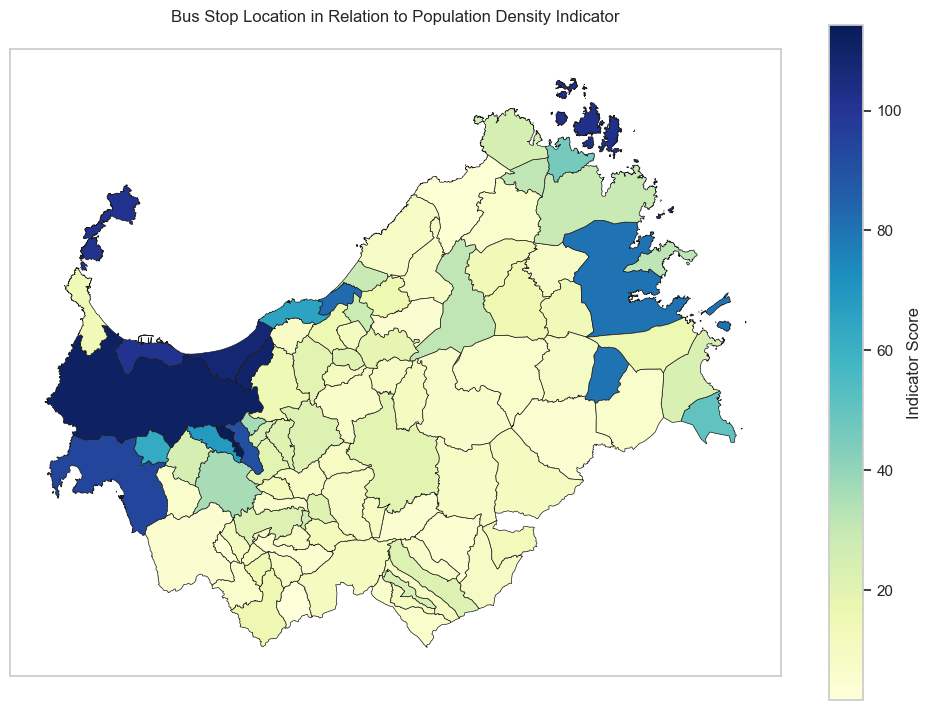

In [476]:
# create a figure and axis for the map
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# plot the choropleth map
plot = merged_bus_pop_mun.plot(column='Indicator_Score', ax=ax, legend=True, cmap='YlGnBu', edgecolor='k', linewidth=0.5, legend_kwds={'label': "Indicator Score", 'shrink': 0.7})

# set plot title
plt.title('Bus Stop Location in Relation to Population Density Indicator', pad=20)

# remove x and y axis labels
ax.set_xticks([])
ax.set_yticks([])

# show the plot
plt.tight_layout()

# get the legend from the plot object
legend = plot.get_legend()

# save image
plt.savefig('../figures/Bus Stop Location in Relation to Population Density Indicator.png', bbox_inches='tight', dpi=300)
plt.show()

The interpretation of the visualization involves analyzing how well bus stops are strategically placed in relation to population density. Areas with a high population density and well-placed bus stops will likely have darker colors on the map, indicating a higher indicator score. On the other hand, areas with lower population density and less strategic bus stop placement will have lighter colors and lower scores.

- Darker colors on the choropleth map indicate higher indicator scores. This means that in these areas, the placement of bus stops is considered more strategic in relation to population density. In other words, there's a higher likelihood that bus stops are conveniently situated in locations where they are accessible to a larger number of residents.

- Lighter colors represent lower indicator scores. These areas may have less strategic bus stop placement concerning population density. Bus stops might be located in regions with lower population concentrations, making them less accessible to potential passengers.

_v3_

In [477]:
print(geo_bus_stops_sassari.shape)
print('')
print(geo_bus_stops_sassari.head(2))

(2653, 7)

     stop_id                        stop_name   stop_lat  stop_lon  \
0  ATPSS_455       Fermata di Via De Cupis 32  40.761698  8.500294   
1   ASPO1051  Fermata di 1051 - Colcò agraria  40.905960  9.501480   

  stop_comune        stop_type                        geometry  
0     SASSARI  Fermata Autobus  POINT (457822.882 4512423.916)  
1       OLBIA  Fermata Autobus  POINT (542235.201 4528438.848)  


In [478]:
print(population_sassari.shape)
print('')
print(population_sassari.head(2))

(92, 2)

     Comune  Popolazione
0    Aggius         1403
1  Aglientu         1169


In [479]:
print(municipalities_sassari.shape)
print('')
print(municipalities_sassari.head(2))

(92, 5)

   COMUNE    SHAPE_LENG    Shape_Le_1  \
0  Banari  22713.497329  22713.321753   
1  Burgos  32641.249234  32640.994286   

                                            geometry       Area  
0  POLYGON ((472024.694 4494517.709, 472059.693 4...  21.250886  
1  POLYGON ((495120.515 4475767.856, 495223.515 4...  18.076958  


In [480]:
mun_pop_gdf = municipalities_sassari.merge(population_sassari, left_on='COMUNE', right_on='Comune', how='left')
mun_pop_gdf['Population_Density'] = mun_pop_gdf['Popolazione'] / mun_pop_gdf['Area']

In [481]:
mun_pop_gdf

,COMUNE,SHAPE_LENG,Shape_Le_1,geometry,Area,Comune,Popolazione,Population_Density
0,Banari,22713.497329,22713.321753,"POLYGON ((472024.694 4494517.709, 472059.693 4...",21.250886,Banari,516,24.281340
1,Burgos,32641.249234,32640.994286,"POLYGON ((495120.515 4475767.856, 495223.515 4...",18.076958,Burgos,855,47.297780
2,Padria,41042.452979,41042.133766,"POLYGON ((464944.750 4477426.841, 464994.749 4...",48.394150,Padria,599,12.377529
3,Monteleone Rocca Doria,20321.212472,20321.055657,"POLYGON ((461499.776 4483001.798, 461519.776 4...",13.385846,Monteleone Rocca Doria,105,7.844106
4,Cossoine,41227.178497,41226.858229,"POLYGON ((469671.713 4480016.822, 469686.713 4...",39.170380,Cossoine,761,19.427946
...,...,...,...,...,...,...,...,...
87,Perfugas,44036.970233,44036.632047,"POLYGON ((492169.162 4522584.119, 492185.537 4...",60.880267,Perfugas,2252,36.990639
88,Mara,21459.511033,21459.343271,"POLYGON ((470896.703 4479248.828, 470888.704 4...",18.643362,Mara,527,28.267434
89,Siligo,35358.500355,35358.226900,"POLYGON ((480632.627 4497711.685, 480670.627 4...",43.448663,Siligo,789,18.159362
90,Loiri Porto San Paolo,61488.104430,61487.633075,"POLYGON ((553525.069 4526140.213, 553535.944 4...",118.519633,Loiri Porto San Paolo,3679,31.041271


In [482]:
# make sure the GeoDataFrame is in EPSG:4326 CRS (WGS 84)
mun_pop_gdf = mun_pop_gdf.to_crs(epsg=4326)
geo_bus_stops_sassari = geo_bus_stops_sassari.to_crs(epsg=4326)

In [483]:
overlay_gdf = gpd.sjoin(geo_bus_stops_sassari, mun_pop_gdf, predicate='within')

The value of population density is typically measured in individuals (or people) per unit area. The common unit of area used in population density calculations can vary, but it's often measured in square kilometers (km²) or square miles (mi²), depending on the context. The formula for calculating population density is:

$Population Density = \frac{Population}{Area}$


Where:
- **Population** is the total number of individuals (people) in the given area.
- **Area** is the total land area of that region in the chosen unit (e.g., square kilometers or square miles).

This calculation helps to provide insight into how concentrated the population is in a specific geographic area. A higher population density value indicates that more people are living in a relatively smaller land area, while a lower value indicates that fewer people are spread out over a larger land area.

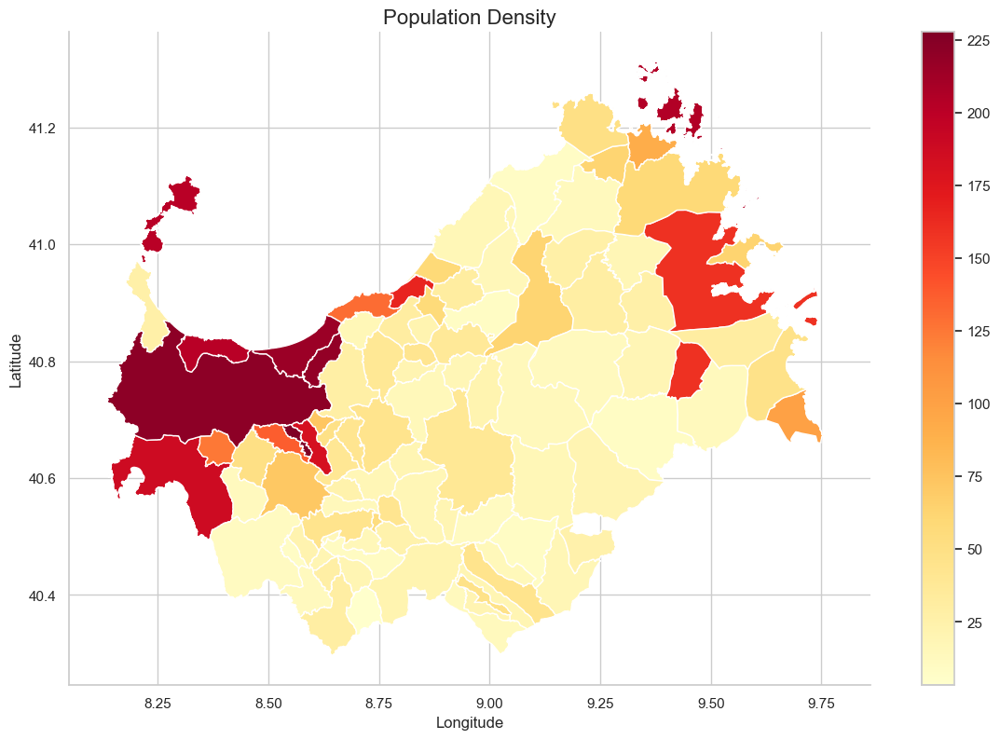

In [484]:
# create a color-blind friendly color palette
palette = sns.color_palette("YlOrRd", as_cmap=True)

# plot the map
fig, ax = plt.subplots(figsize=(12, 8))
mun_pop_gdf.plot(column='Population_Density', ax=ax, legend=True, cmap=palette)
plt.title('Population Density', fontsize=16)
plt.xlabel('Longitude', fontsize=12)
plt.ylabel('Latitude', fontsize=12)
sns.despine()  # Remove top and right spines
plt.tight_layout()

# save image
plt.savefig('../figures/Population Density.png', bbox_inches='tight', dpi=300)
plt.show()

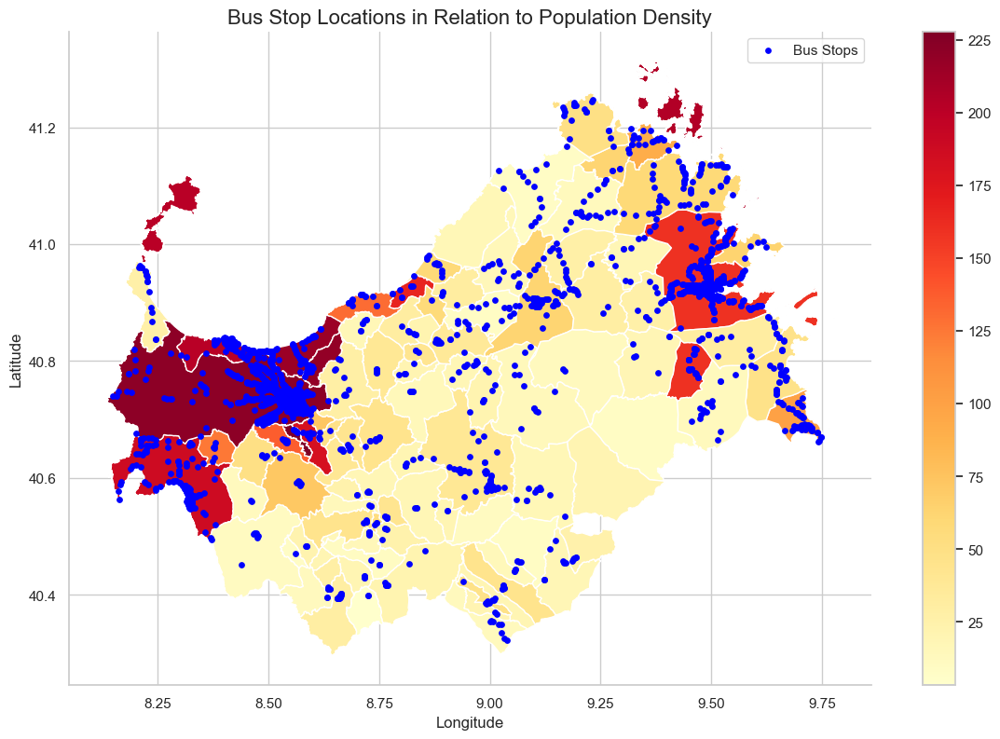

In [485]:
# create a color-blind friendly color palette
palette = sns.color_palette("YlOrRd", as_cmap=True)

# plot the map
fig, ax = plt.subplots(figsize=(12, 8))
mun_pop_gdf.plot(column='Population_Density', ax=ax, legend=True, cmap=palette)
overlay_gdf.plot(ax=ax, color='blue', markersize=15, label='Bus Stops', zorder=5)
plt.title('Bus Stop Locations in Relation to Population Density', fontsize=16)
plt.xlabel('Longitude', fontsize=12)
plt.ylabel('Latitude', fontsize=12)
plt.legend()
sns.despine()  # Remove top and right spines
plt.tight_layout()

# save image
plt.savefig('../figures/Bus Stop Locations in Relation to Population Density.png', bbox_inches='tight', dpi=300)
plt.show()